In [13]:
import numpy as np
import matplotlib.pyplot as plt
import sys
import astropy
from photutils import Background2D
from astropy.visualization import simple_norm
from photutils import make_source_mask
from astropy.stats import mad_std
from astropy.table import Table
import configparser
import time

In [14]:
def Background(image, head, name, norm, sigma):
    # I am defining variables x and y to be the box size that Background2D uses.
    # Greg recommended using around 36 boxes in total, so I am taking 2*head['CRPIX1'] to be
    # the width of the image, then I divide by 3 so that 3x3 boxes will cover the image.
    x = int(2*head['CRPIX1']/6)
    y = int(2*head['CRPIX2']/6)
    
    sigma = sigma
    
    mask = make_source_mask(image, nsigma=sigma, npixels=3, dilate_size=10)
    bkg = Background2D(image, (x,y), sigma_clip = None, mask = mask,exclude_percentile=50)
    #bkg = Background2D(image, (x,y), mask=mask)
    
    
    # This adjusts the stretch for the background image
    bkg_min, bkg_max = np.min(bkg.background), np.max(bkg.background)
    
    # This changes the scale of the color bars. The default is too big
    scale = 0.85
    
    
    bs  = image - bkg.background
    
    fig, axs = plt.subplots(2, 4, figsize=(16,7))
    
    # This plots the original image with colorbar
    im1 = axs[0,0].imshow(image, origin='lower', cmap='Greys_r', norm=norm)
    axs[0,0].set_title('(a) %s'%(name))
    fig.colorbar(im1, ax=axs[0,0], shrink=scale)
    
    
    # This plots the background
    im3 = axs[0,1].imshow(bkg.background, origin='lower', cmap='Greys_r', norm=norm)
    axs[0,1].set_title('(b) Background')
    fig.colorbar(im3, ax=axs[0,1], shrink=scale)
    
    
    # This plots the background subtracted image and saves it as a new fits file
    im4 = axs[0,2].imshow(bs, origin='lower', cmap='Greys_r', norm=norm)
    axs[0,2].set_title('(c) Background Subtracted')
    fig.colorbar(im4, ax=axs[0,2], shrink=scale)
    
    hdu2 = astropy.io.fits.PrimaryHDU(bs,header=head)
    hdu2.writeto(save_bs,overwrite=True)
    
    
    # This plots the background
    im2 = axs[0,3].imshow(bkg.background, origin='lower', cmap='Greys_r' , vmin=bkg_min, vmax=bkg_max)
    axs[0,3].set_title('(d) Background')
    fig.colorbar(im2, ax=axs[0,3], shrink=scale)
    
    
    # This plots the mask
    axs[1,0].imshow(mask, origin='lower', cmap='Greys_r')
    axs[1,0].set_title('(e) %s sigma mask'%(sigma))
    #fig.colorbar(im2, ax=axs[0,2], shrink=scale)
    ratio = 0.8
    axs[1,0].set_aspect(1.0/axs[1,0].get_data_ratio()*ratio)
    
    
    # This plots a histogram of the pixels in the original image
    axs[1,1].hist(data.flatten(),35, label = 'Original')
    axs[1,1].set_title('(f) Histogram')
    axs[1,1].legend()
    #This histogram kept streching vertically. These two lines resolve that issue.
    ratio = 0.85
    axs[1,1].set_aspect(1.0/axs[1,1].get_data_ratio()*ratio)
    
    
    axs[1,2].hist(bs.flatten(),35, label = 'B.S.', color='orange')
    axs[1,2].set_title('(g) Histogram')
    axs[1,2].legend()
    #This histogram kept streching vertically. These two lines resolve that issue.
    ratio = 0.85
    axs[1,2].set_aspect(1.0/axs[1,2].get_data_ratio()*ratio)
    
    
    # This plots the original image with the grid used for background subtraction overlayed on top.
    # This plot needs to be last because the gridsize keeps applying itself to the last plot in the subplot
    im6 = axs[1,3].imshow(image, origin='lower', cmap='Greys_r', norm=norm)
    bkg.plot_meshes(outlines=True, color='red')
    axs[1,3].set_title('(h) Mesh Grid')
    fig.colorbar(im6, ax=axs[1,3], shrink=scale)
    
    plt.savefig(save_png)
    plt.show()
    
    print()
    print('Background = ',mad_std(image))
    
    hdu1 = astropy.io.fits.PrimaryHDU(bkg.background,header=head)
    hdu1.writeto(save_bkg,overwrite=True)

In [15]:
Filter_1 = ['f105w', 'f125w', 'f140w', 'f160w', 'f435w', 'f606w', 'f814w']

In [16]:
# Read in catalog of clumpy galaxies
cat_path = '/Users/brian.merino/Desktop/JWST/RELICS/large_clump_sources.cat'
catalog = Table.read(cat_path,format='ascii')

sigma = 1.5

#cluster = config.get('CONFIG','cluster')
#ID = int(config.get('CONFIG','Id'))

FILTER = Filter_1
catalog.show_in_notebook()

idx,ra,dec,rad,rad_pix,cluster,ID,zb
0,110.8848976,-73.4383188,2.921,73,smacs0723,1906,0.661
1,110.8889184,-73.4387821,2.307,58,smacs0723,1932,0.624
2,110.7912283,-73.4391504,2.0,50,smacs0723,2038,0.72
3,110.8979947,-73.4419844,2.237,56,smacs0723,2363,0.43
4,110.8210877,-73.4414434,1.438,36,smace0723,2549,1.13
5,110.7566116,-73.4460512,2.0,50,smacs0723,2868,0.783
6,110.8952667,-73.4460606,3.808,95,smacs0723,2896,0.844
7,110.798628,-73.4486724,4.186,105,smacs0723,3225,1.184
8,110.871365,-73.4554603,1.597,40,smacs0723,4021,1.069
9,110.7796974,-73.4580321,2.93,73,smacs0723,4193,0.319


        Use SegmentationImage.make_source_mask instead. [warnings]


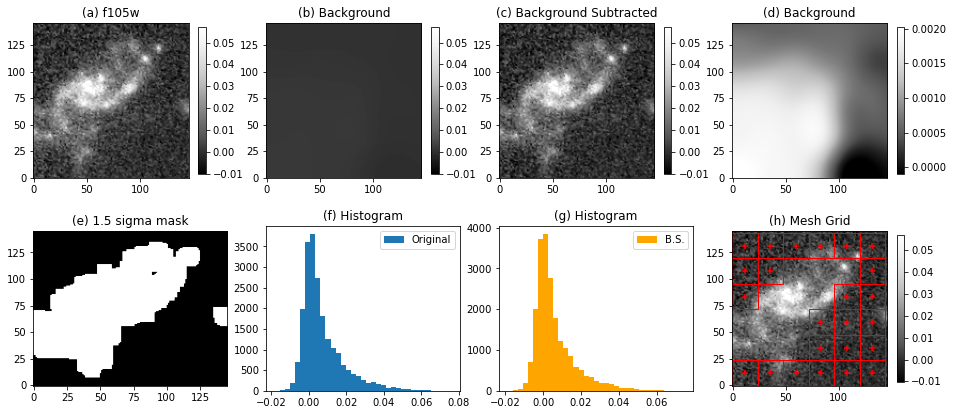


Background =  0.007011923067347802

Background subtracted image saved to /Users/brian.merino/Desktop/JWST/RELICS/BS_files/bs/f105w_1906_bs.fits
Background saved to /Users/brian.merino/Desktop/JWST/RELICS/BS_files/bkg/f105w_1906_bkg.fits



        Use SegmentationImage.make_source_mask instead. [warnings]


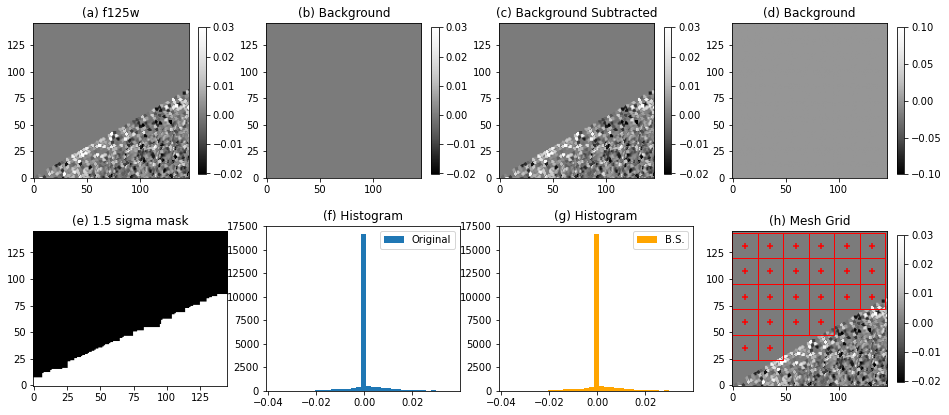


Background =  0.0

Background subtracted image saved to /Users/brian.merino/Desktop/JWST/RELICS/BS_files/bs/f125w_1906_bs.fits
Background saved to /Users/brian.merino/Desktop/JWST/RELICS/BS_files/bkg/f125w_1906_bkg.fits



        Use SegmentationImage.make_source_mask instead. [warnings]


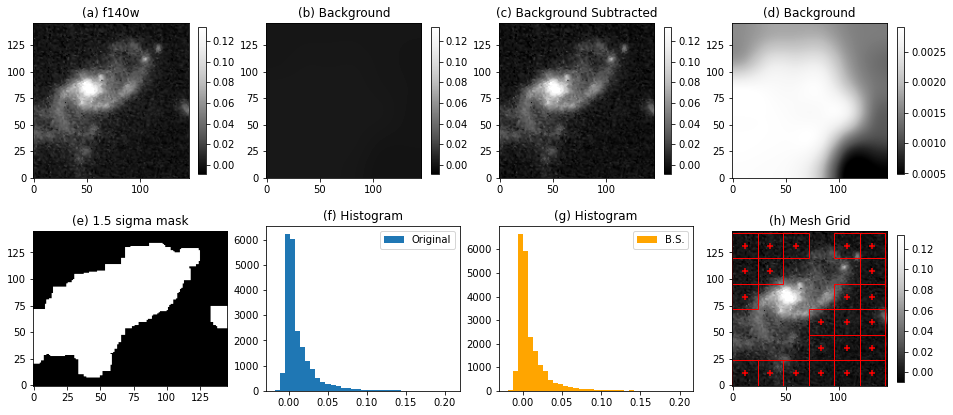


Background =  0.008728943466417937

Background subtracted image saved to /Users/brian.merino/Desktop/JWST/RELICS/BS_files/bs/f140w_1906_bs.fits
Background saved to /Users/brian.merino/Desktop/JWST/RELICS/BS_files/bkg/f140w_1906_bkg.fits



        Use SegmentationImage.make_source_mask instead. [warnings]


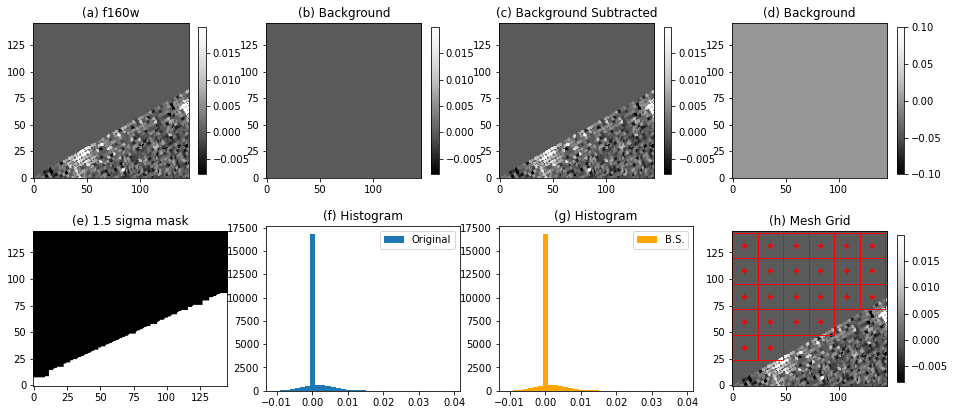


Background =  0.0

Background subtracted image saved to /Users/brian.merino/Desktop/JWST/RELICS/BS_files/bs/f160w_1906_bs.fits
Background saved to /Users/brian.merino/Desktop/JWST/RELICS/BS_files/bkg/f160w_1906_bkg.fits



        Use SegmentationImage.make_source_mask instead. [warnings]


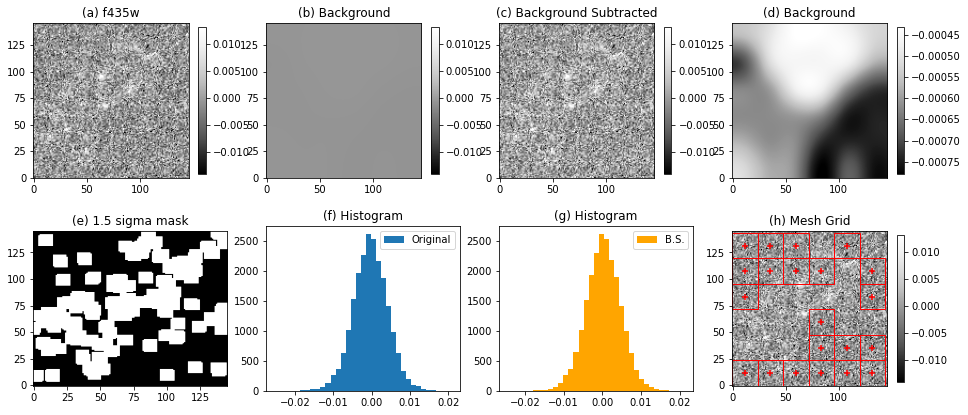


Background =  0.0043486693860241695

Background subtracted image saved to /Users/brian.merino/Desktop/JWST/RELICS/BS_files/bs/f435w_1906_bs.fits
Background saved to /Users/brian.merino/Desktop/JWST/RELICS/BS_files/bkg/f435w_1906_bkg.fits



        Use SegmentationImage.make_source_mask instead. [warnings]


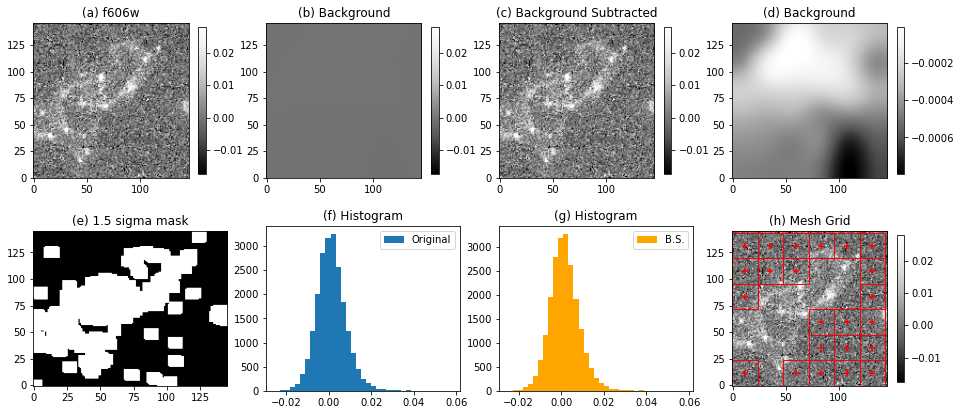


Background =  0.00615447330755566

Background subtracted image saved to /Users/brian.merino/Desktop/JWST/RELICS/BS_files/bs/f606w_1906_bs.fits
Background saved to /Users/brian.merino/Desktop/JWST/RELICS/BS_files/bkg/f606w_1906_bkg.fits



        Use SegmentationImage.make_source_mask instead. [warnings]


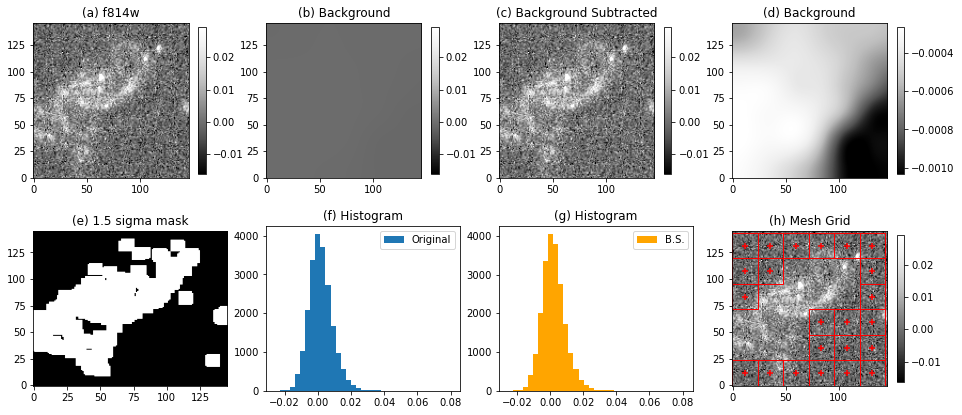


Background =  0.006402788805014938

Background subtracted image saved to /Users/brian.merino/Desktop/JWST/RELICS/BS_files/bs/f814w_1906_bs.fits
Background saved to /Users/brian.merino/Desktop/JWST/RELICS/BS_files/bkg/f814w_1906_bkg.fits



        Use SegmentationImage.make_source_mask instead. [warnings]


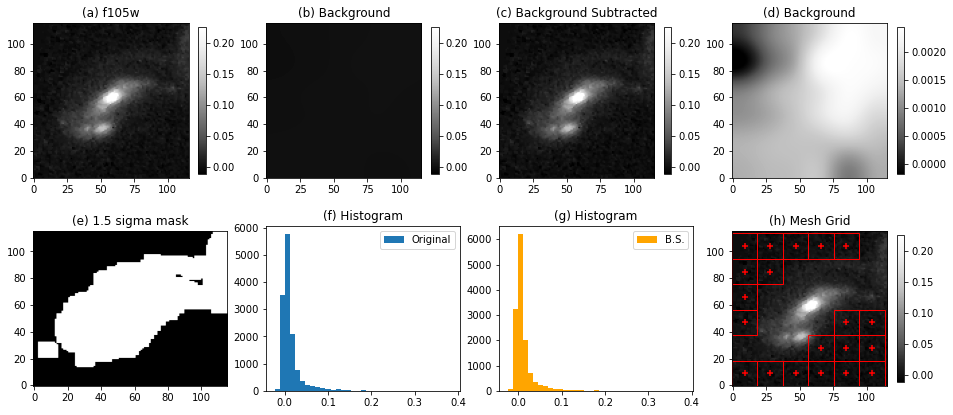


Background =  0.008795563384017848

Background subtracted image saved to /Users/brian.merino/Desktop/JWST/RELICS/BS_files/bs/f105w_1932_bs.fits
Background saved to /Users/brian.merino/Desktop/JWST/RELICS/BS_files/bkg/f105w_1932_bkg.fits



        Use SegmentationImage.make_source_mask instead. [warnings]


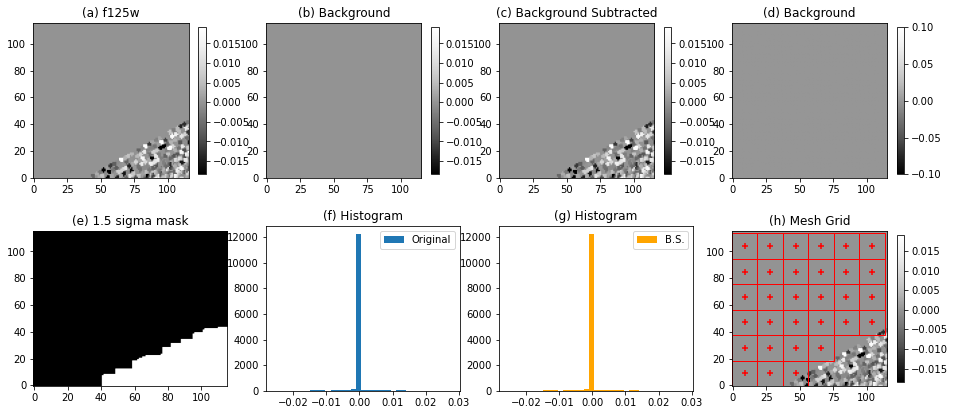


Background =  0.0

Background subtracted image saved to /Users/brian.merino/Desktop/JWST/RELICS/BS_files/bs/f125w_1932_bs.fits
Background saved to /Users/brian.merino/Desktop/JWST/RELICS/BS_files/bkg/f125w_1932_bkg.fits



        Use SegmentationImage.make_source_mask instead. [warnings]


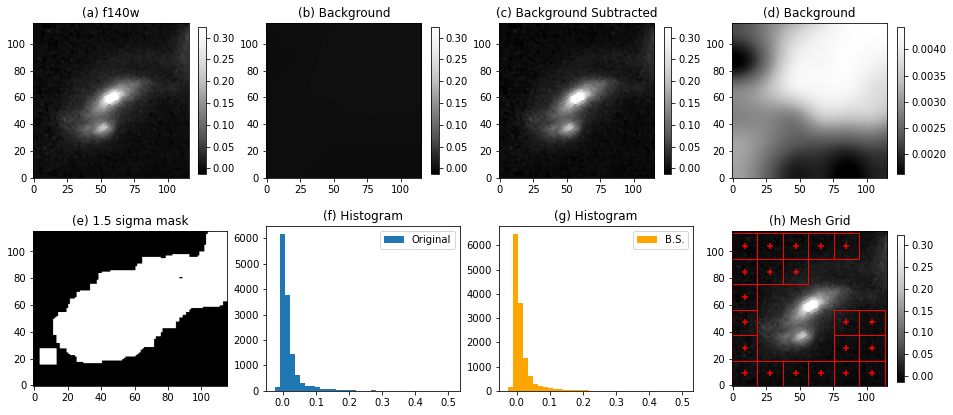


Background =  0.01153406203092862

Background subtracted image saved to /Users/brian.merino/Desktop/JWST/RELICS/BS_files/bs/f140w_1932_bs.fits
Background saved to /Users/brian.merino/Desktop/JWST/RELICS/BS_files/bkg/f140w_1932_bkg.fits



        Use SegmentationImage.make_source_mask instead. [warnings]


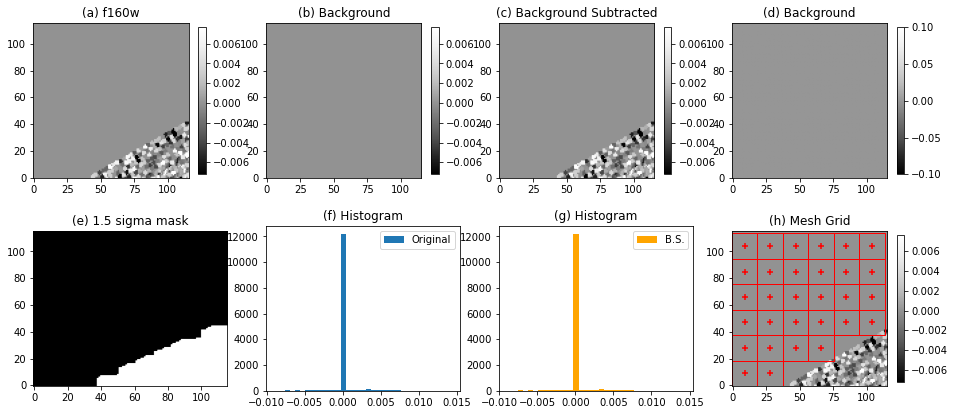


Background =  0.0

Background subtracted image saved to /Users/brian.merino/Desktop/JWST/RELICS/BS_files/bs/f160w_1932_bs.fits
Background saved to /Users/brian.merino/Desktop/JWST/RELICS/BS_files/bkg/f160w_1932_bkg.fits



        Use SegmentationImage.make_source_mask instead. [warnings]


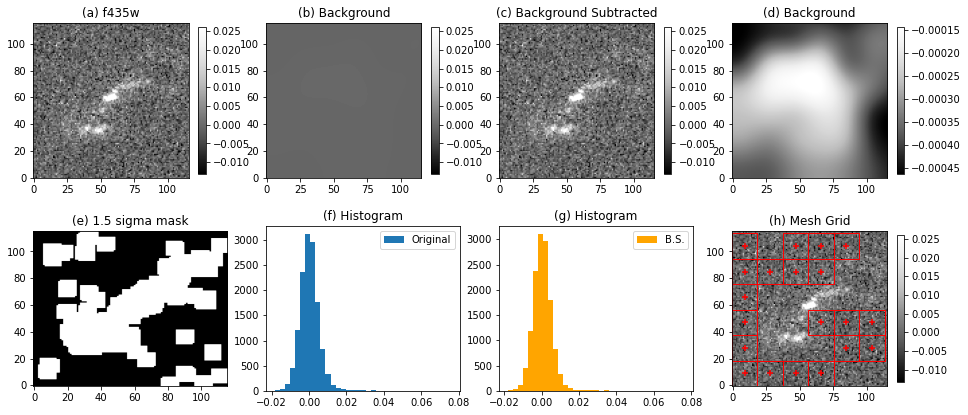


Background =  0.004428869974316211

Background subtracted image saved to /Users/brian.merino/Desktop/JWST/RELICS/BS_files/bs/f435w_1932_bs.fits
Background saved to /Users/brian.merino/Desktop/JWST/RELICS/BS_files/bkg/f435w_1932_bkg.fits



        Use SegmentationImage.make_source_mask instead. [warnings]


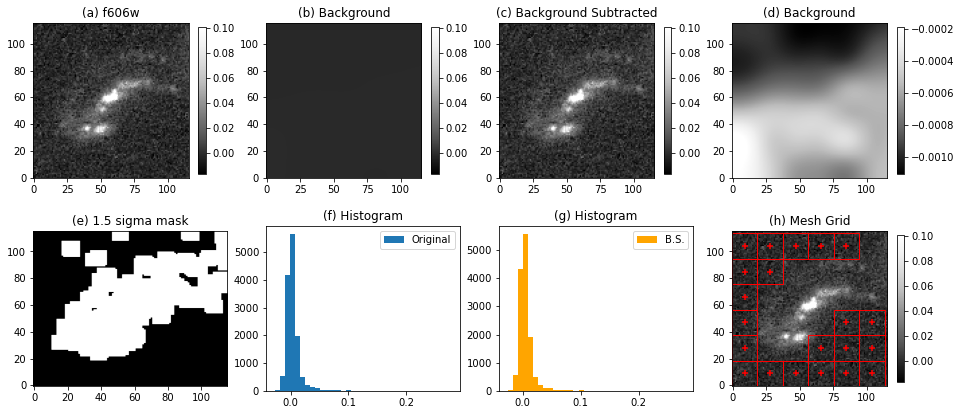


Background =  0.007177661652559859

Background subtracted image saved to /Users/brian.merino/Desktop/JWST/RELICS/BS_files/bs/f606w_1932_bs.fits
Background saved to /Users/brian.merino/Desktop/JWST/RELICS/BS_files/bkg/f606w_1932_bkg.fits



        Use SegmentationImage.make_source_mask instead. [warnings]


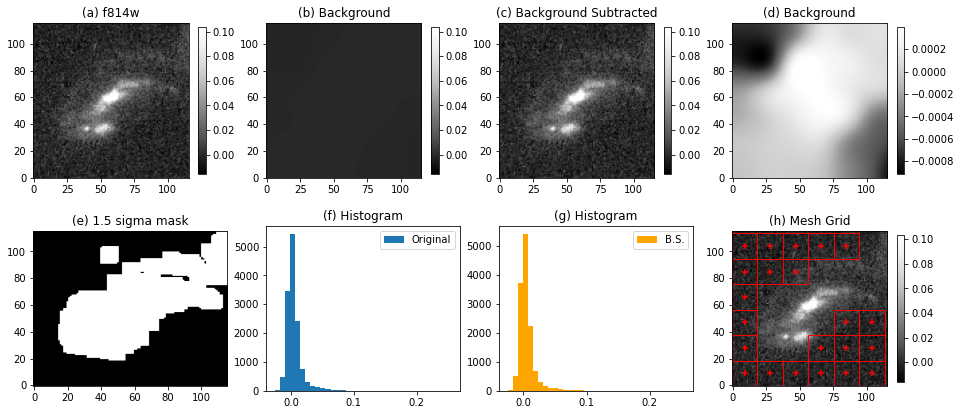


Background =  0.0075179164472623395

Background subtracted image saved to /Users/brian.merino/Desktop/JWST/RELICS/BS_files/bs/f814w_1932_bs.fits
Background saved to /Users/brian.merino/Desktop/JWST/RELICS/BS_files/bkg/f814w_1932_bkg.fits



        Use SegmentationImage.make_source_mask instead. [warnings]


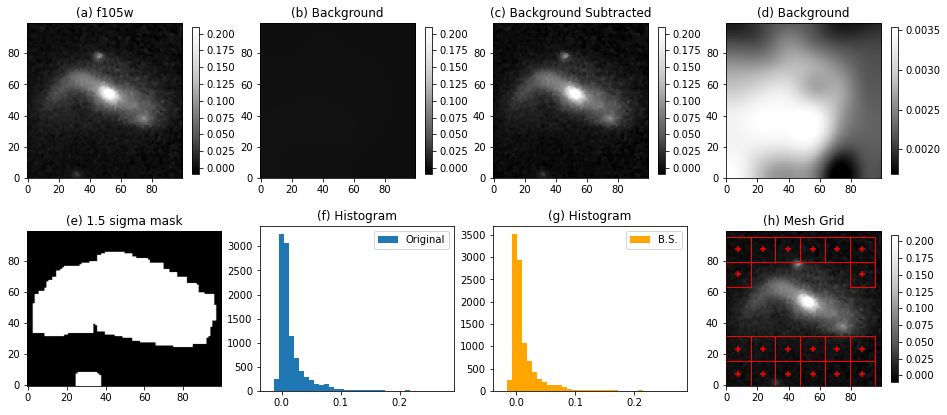


Background =  0.009351890370636697

Background subtracted image saved to /Users/brian.merino/Desktop/JWST/RELICS/BS_files/bs/f105w_2038_bs.fits
Background saved to /Users/brian.merino/Desktop/JWST/RELICS/BS_files/bkg/f105w_2038_bkg.fits



        Use SegmentationImage.make_source_mask instead. [warnings]


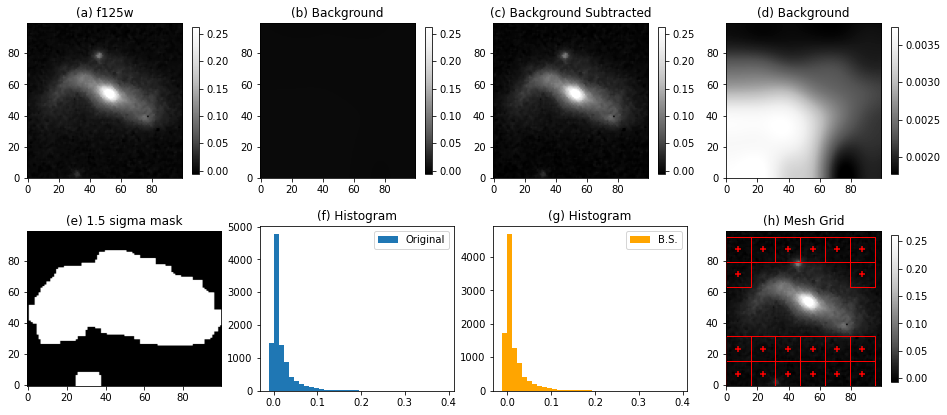


Background =  0.009611460613336334

Background subtracted image saved to /Users/brian.merino/Desktop/JWST/RELICS/BS_files/bs/f125w_2038_bs.fits
Background saved to /Users/brian.merino/Desktop/JWST/RELICS/BS_files/bkg/f125w_2038_bkg.fits



        Use SegmentationImage.make_source_mask instead. [warnings]


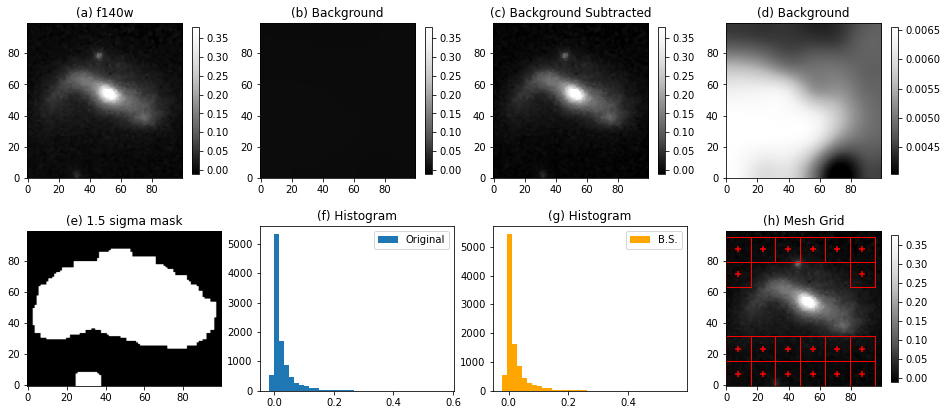


Background =  0.013440612560771361

Background subtracted image saved to /Users/brian.merino/Desktop/JWST/RELICS/BS_files/bs/f140w_2038_bs.fits
Background saved to /Users/brian.merino/Desktop/JWST/RELICS/BS_files/bkg/f140w_2038_bkg.fits



        Use SegmentationImage.make_source_mask instead. [warnings]


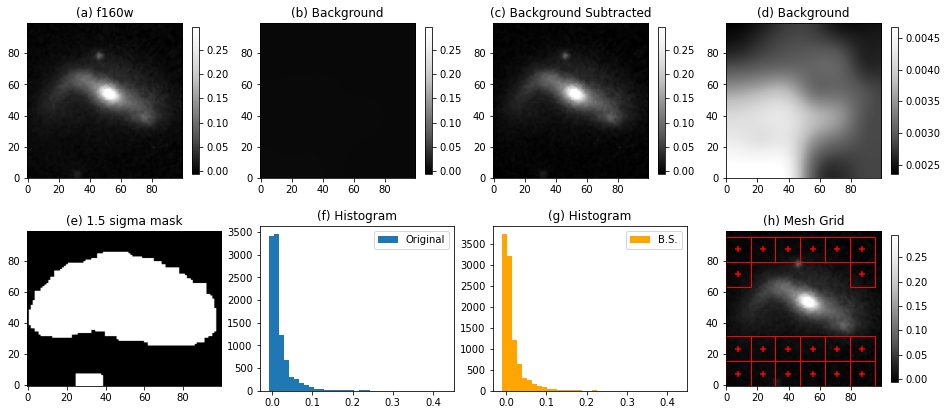


Background =  0.00944073878980107

Background subtracted image saved to /Users/brian.merino/Desktop/JWST/RELICS/BS_files/bs/f160w_2038_bs.fits
Background saved to /Users/brian.merino/Desktop/JWST/RELICS/BS_files/bkg/f160w_2038_bkg.fits



        Use SegmentationImage.make_source_mask instead. [warnings]


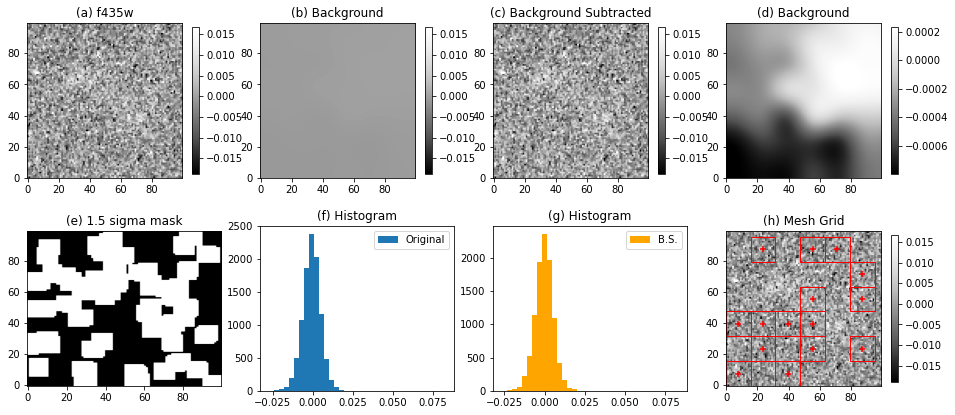


Background =  0.00522531579768607

Background subtracted image saved to /Users/brian.merino/Desktop/JWST/RELICS/BS_files/bs/f435w_2038_bs.fits
Background saved to /Users/brian.merino/Desktop/JWST/RELICS/BS_files/bkg/f435w_2038_bkg.fits



        Use SegmentationImage.make_source_mask instead. [warnings]


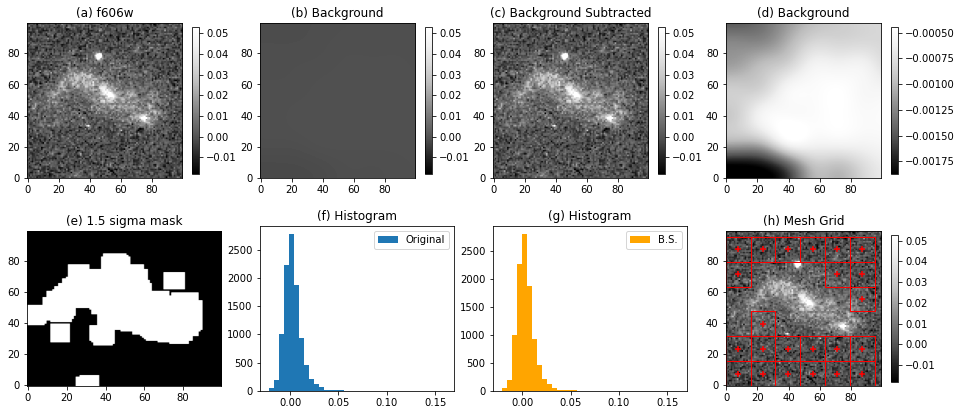


Background =  0.0073422017199374625

Background subtracted image saved to /Users/brian.merino/Desktop/JWST/RELICS/BS_files/bs/f606w_2038_bs.fits
Background saved to /Users/brian.merino/Desktop/JWST/RELICS/BS_files/bkg/f606w_2038_bkg.fits



        Use SegmentationImage.make_source_mask instead. [warnings]


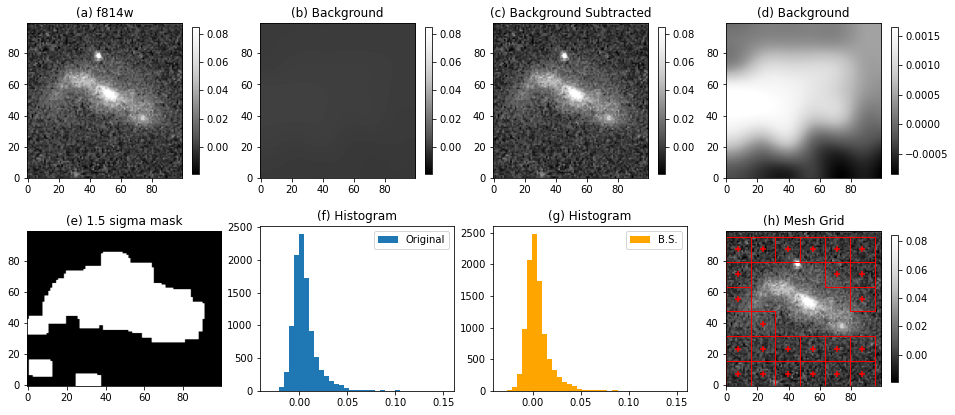


Background =  0.008985010667935537

Background subtracted image saved to /Users/brian.merino/Desktop/JWST/RELICS/BS_files/bs/f814w_2038_bs.fits
Background saved to /Users/brian.merino/Desktop/JWST/RELICS/BS_files/bkg/f814w_2038_bkg.fits



        Use SegmentationImage.make_source_mask instead. [warnings]


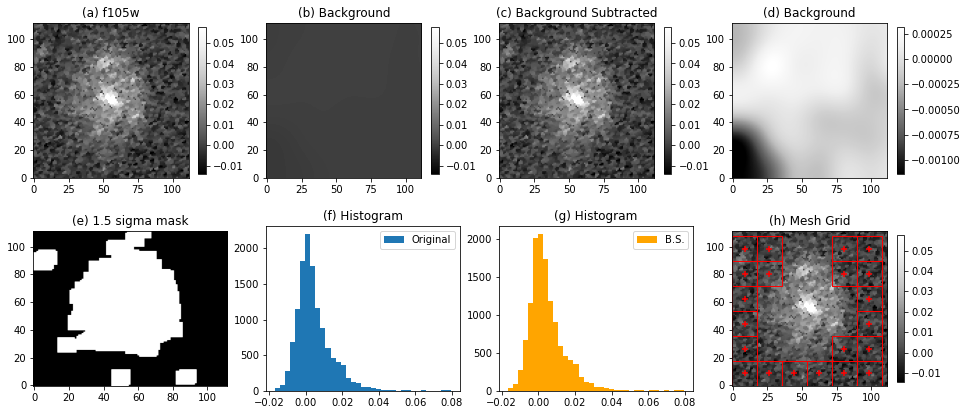


Background =  0.00712006859019352

Background subtracted image saved to /Users/brian.merino/Desktop/JWST/RELICS/BS_files/bs/f105w_2363_bs.fits
Background saved to /Users/brian.merino/Desktop/JWST/RELICS/BS_files/bkg/f105w_2363_bkg.fits



        Use SegmentationImage.make_source_mask instead. [warnings]


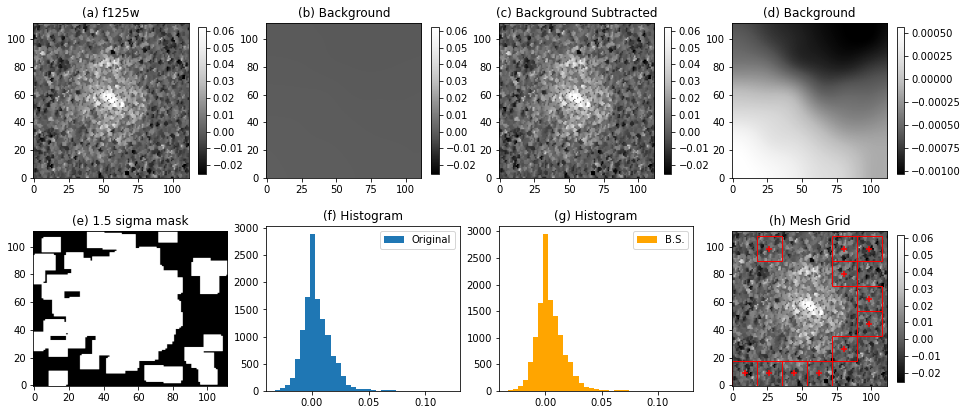


Background =  0.009789631749909475

Background subtracted image saved to /Users/brian.merino/Desktop/JWST/RELICS/BS_files/bs/f125w_2363_bs.fits
Background saved to /Users/brian.merino/Desktop/JWST/RELICS/BS_files/bkg/f125w_2363_bkg.fits



        Use SegmentationImage.make_source_mask instead. [warnings]


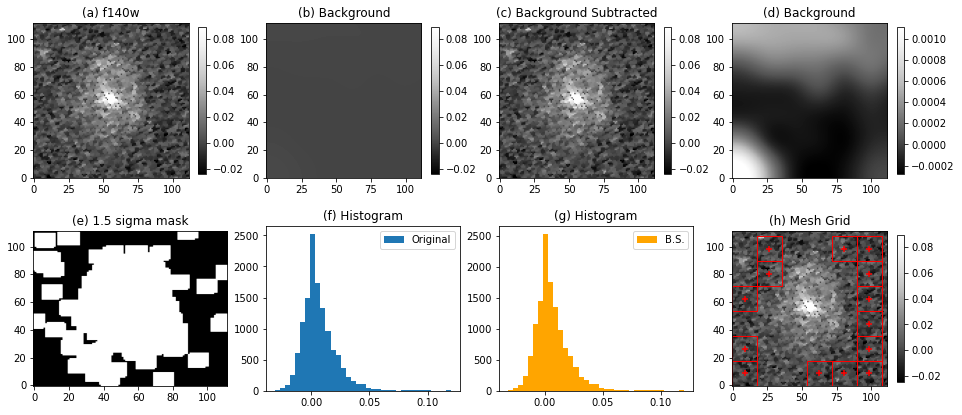


Background =  0.010820805841337133

Background subtracted image saved to /Users/brian.merino/Desktop/JWST/RELICS/BS_files/bs/f140w_2363_bs.fits
Background saved to /Users/brian.merino/Desktop/JWST/RELICS/BS_files/bkg/f140w_2363_bkg.fits



        Use SegmentationImage.make_source_mask instead. [warnings]


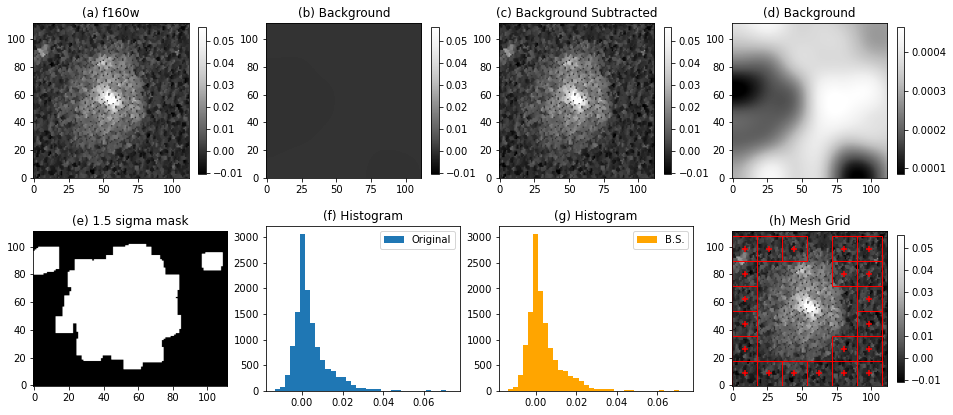


Background =  0.0052092231413138354

Background subtracted image saved to /Users/brian.merino/Desktop/JWST/RELICS/BS_files/bs/f160w_2363_bs.fits
Background saved to /Users/brian.merino/Desktop/JWST/RELICS/BS_files/bkg/f160w_2363_bkg.fits



        Use SegmentationImage.make_source_mask instead. [warnings]


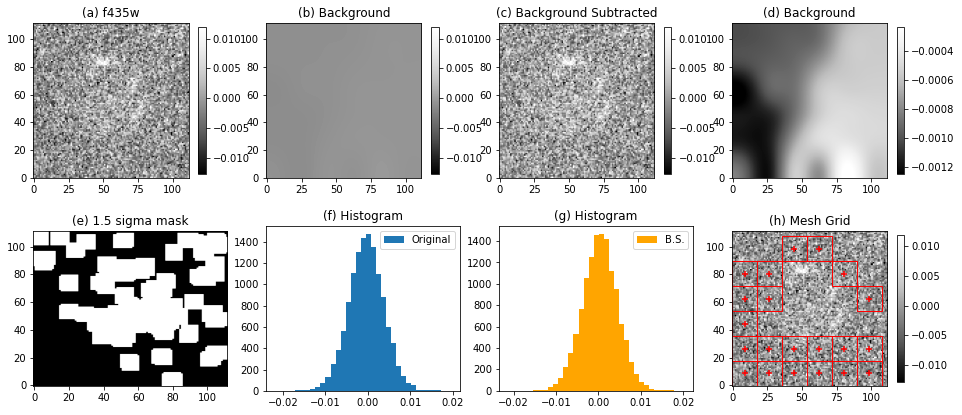


Background =  0.00405436387342479

Background subtracted image saved to /Users/brian.merino/Desktop/JWST/RELICS/BS_files/bs/f435w_2363_bs.fits
Background saved to /Users/brian.merino/Desktop/JWST/RELICS/BS_files/bkg/f435w_2363_bkg.fits



        Use SegmentationImage.make_source_mask instead. [warnings]


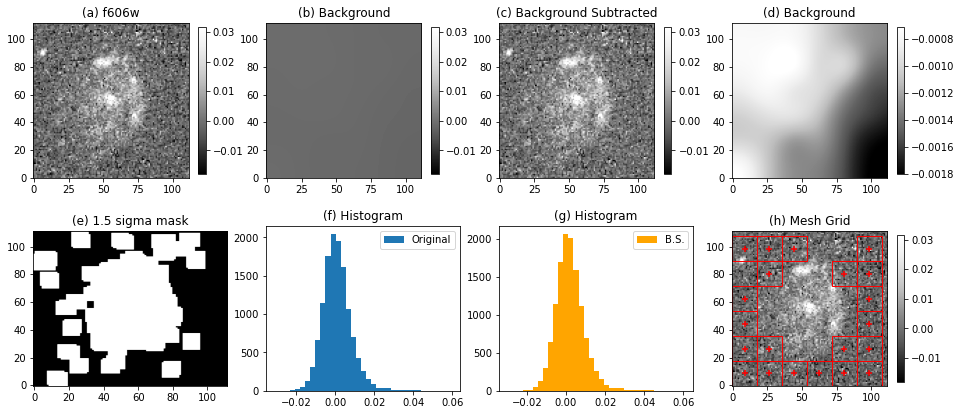


Background =  0.006320495643245805

Background subtracted image saved to /Users/brian.merino/Desktop/JWST/RELICS/BS_files/bs/f606w_2363_bs.fits
Background saved to /Users/brian.merino/Desktop/JWST/RELICS/BS_files/bkg/f606w_2363_bkg.fits



        Use SegmentationImage.make_source_mask instead. [warnings]


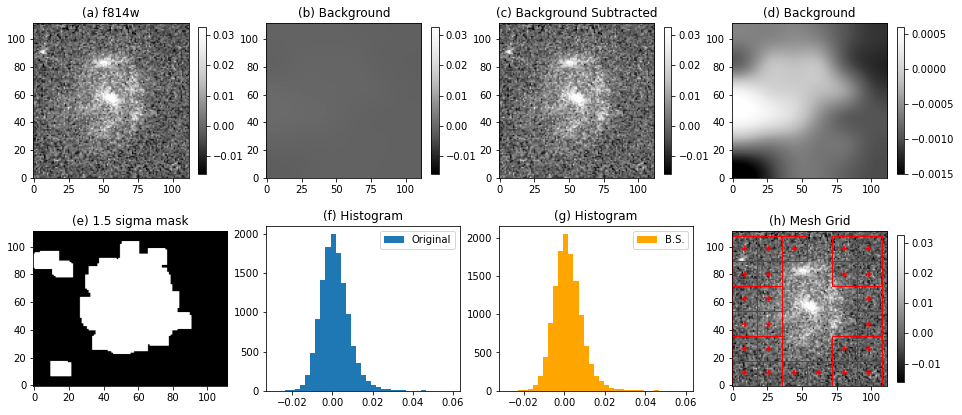


Background =  0.006355073158925978

Background subtracted image saved to /Users/brian.merino/Desktop/JWST/RELICS/BS_files/bs/f814w_2363_bs.fits
Background saved to /Users/brian.merino/Desktop/JWST/RELICS/BS_files/bkg/f814w_2363_bkg.fits



        Use SegmentationImage.make_source_mask instead. [warnings]


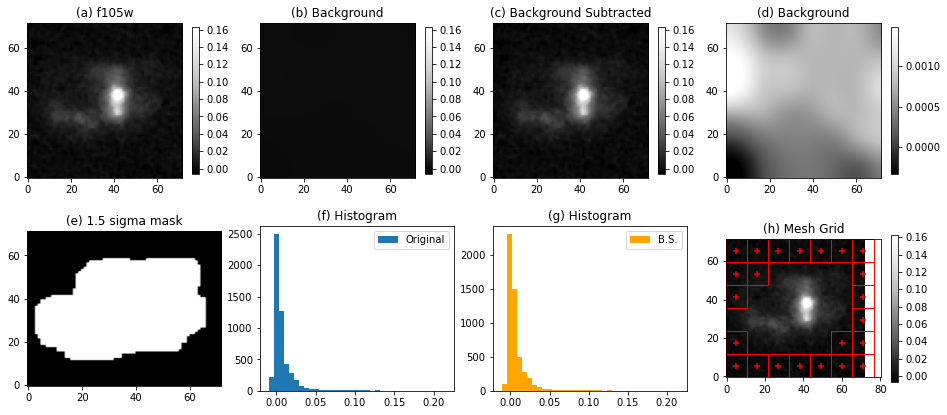


Background =  0.005260100775698762

Background subtracted image saved to /Users/brian.merino/Desktop/JWST/RELICS/BS_files/bs/f105w_2549_bs.fits
Background saved to /Users/brian.merino/Desktop/JWST/RELICS/BS_files/bkg/f105w_2549_bkg.fits



        Use SegmentationImage.make_source_mask instead. [warnings]


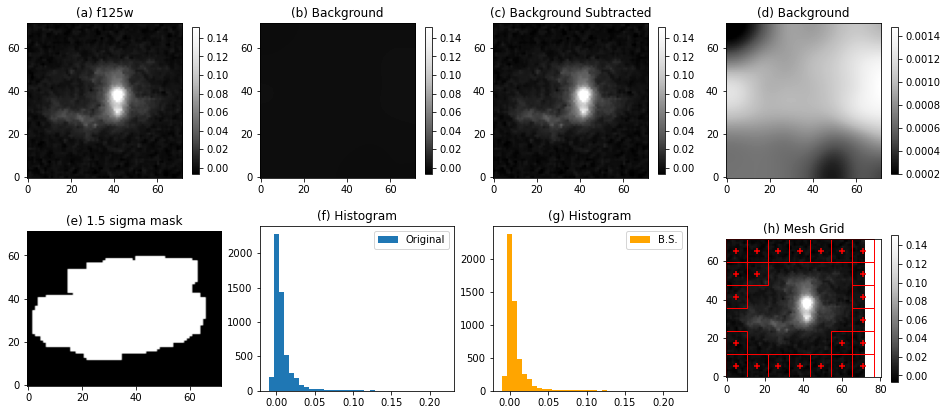


Background =  0.005478440900268459

Background subtracted image saved to /Users/brian.merino/Desktop/JWST/RELICS/BS_files/bs/f125w_2549_bs.fits
Background saved to /Users/brian.merino/Desktop/JWST/RELICS/BS_files/bkg/f125w_2549_bkg.fits



        Use SegmentationImage.make_source_mask instead. [warnings]


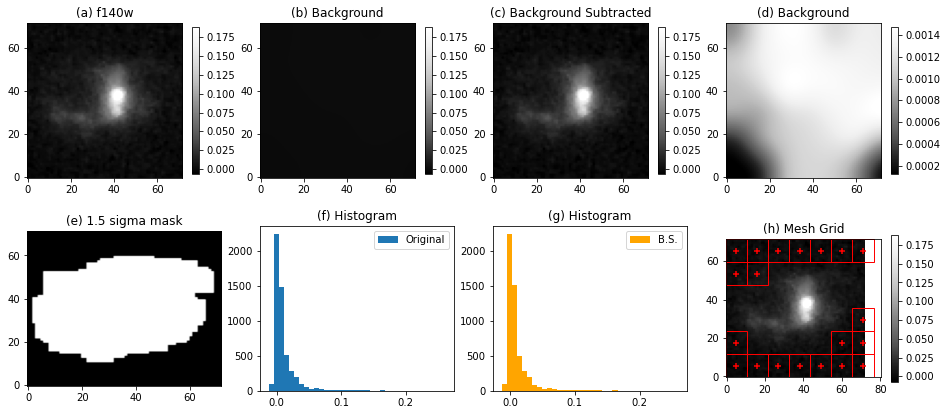


Background =  0.00657990916731156

Background subtracted image saved to /Users/brian.merino/Desktop/JWST/RELICS/BS_files/bs/f140w_2549_bs.fits
Background saved to /Users/brian.merino/Desktop/JWST/RELICS/BS_files/bkg/f140w_2549_bkg.fits



        Use SegmentationImage.make_source_mask instead. [warnings]


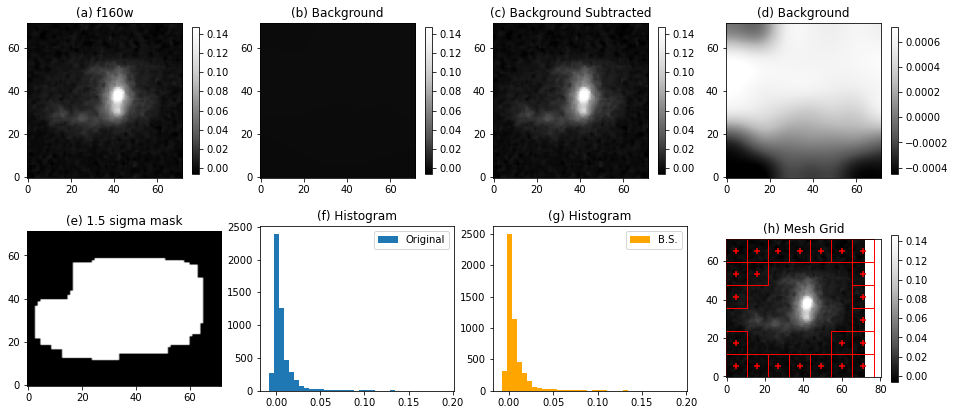


Background =  0.0050453120196431375

Background subtracted image saved to /Users/brian.merino/Desktop/JWST/RELICS/BS_files/bs/f160w_2549_bs.fits
Background saved to /Users/brian.merino/Desktop/JWST/RELICS/BS_files/bkg/f160w_2549_bkg.fits



        Use SegmentationImage.make_source_mask instead. [warnings]


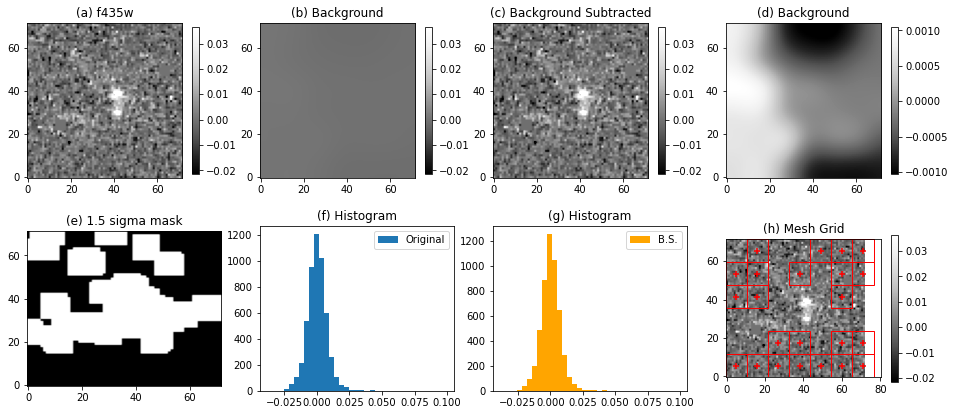


Background =  0.006521320561905312

Background subtracted image saved to /Users/brian.merino/Desktop/JWST/RELICS/BS_files/bs/f435w_2549_bs.fits
Background saved to /Users/brian.merino/Desktop/JWST/RELICS/BS_files/bkg/f435w_2549_bkg.fits



        Use SegmentationImage.make_source_mask instead. [warnings]


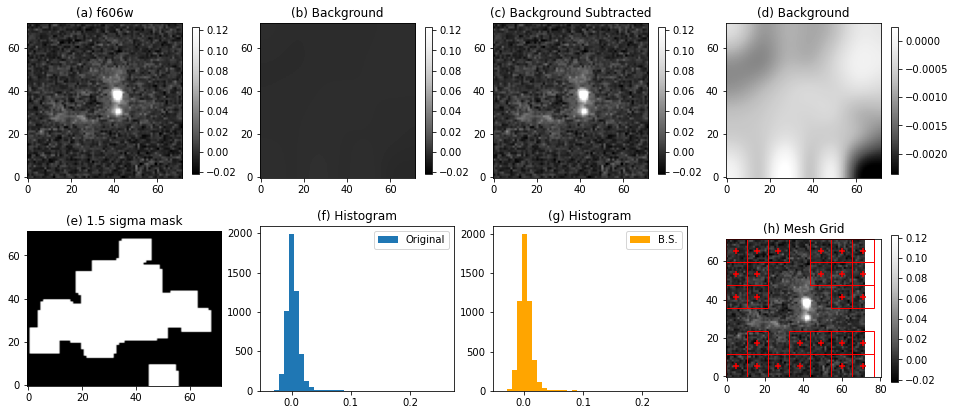


Background =  0.008582377714604851

Background subtracted image saved to /Users/brian.merino/Desktop/JWST/RELICS/BS_files/bs/f606w_2549_bs.fits
Background saved to /Users/brian.merino/Desktop/JWST/RELICS/BS_files/bkg/f606w_2549_bkg.fits



        Use SegmentationImage.make_source_mask instead. [warnings]


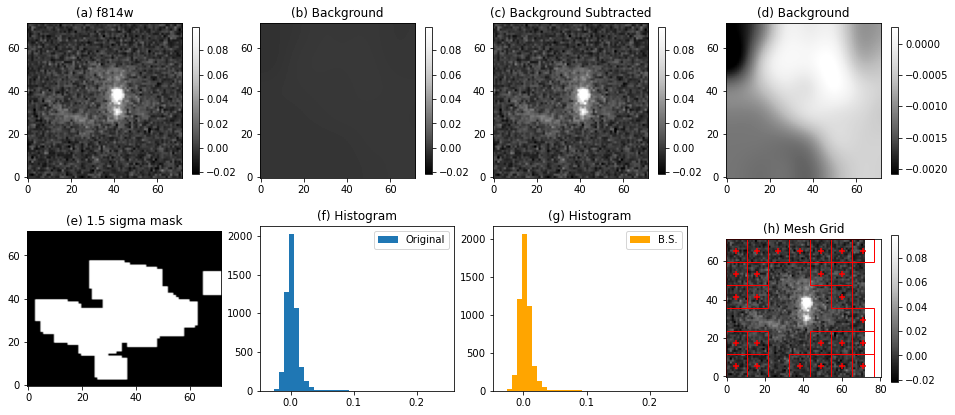


Background =  0.0077281493166880336

Background subtracted image saved to /Users/brian.merino/Desktop/JWST/RELICS/BS_files/bs/f814w_2549_bs.fits
Background saved to /Users/brian.merino/Desktop/JWST/RELICS/BS_files/bkg/f814w_2549_bkg.fits



        Use SegmentationImage.make_source_mask instead. [warnings]


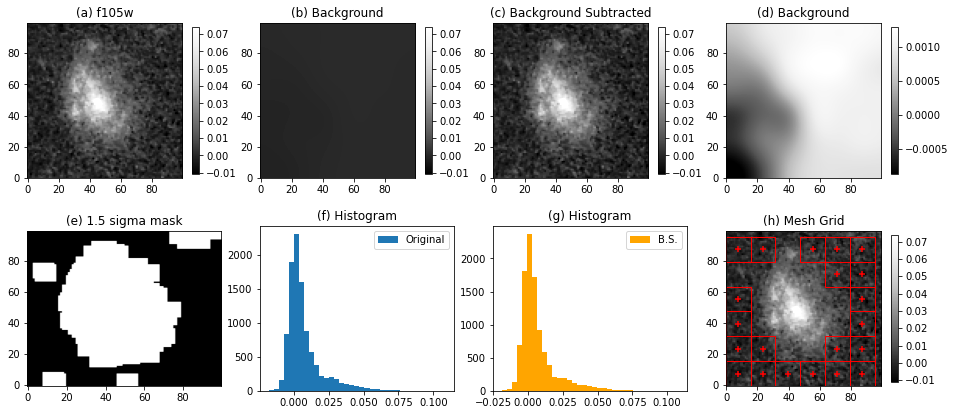


Background =  0.0069023891692917795

Background subtracted image saved to /Users/brian.merino/Desktop/JWST/RELICS/BS_files/bs/f105w_2868_bs.fits
Background saved to /Users/brian.merino/Desktop/JWST/RELICS/BS_files/bkg/f105w_2868_bkg.fits



        Use SegmentationImage.make_source_mask instead. [warnings]


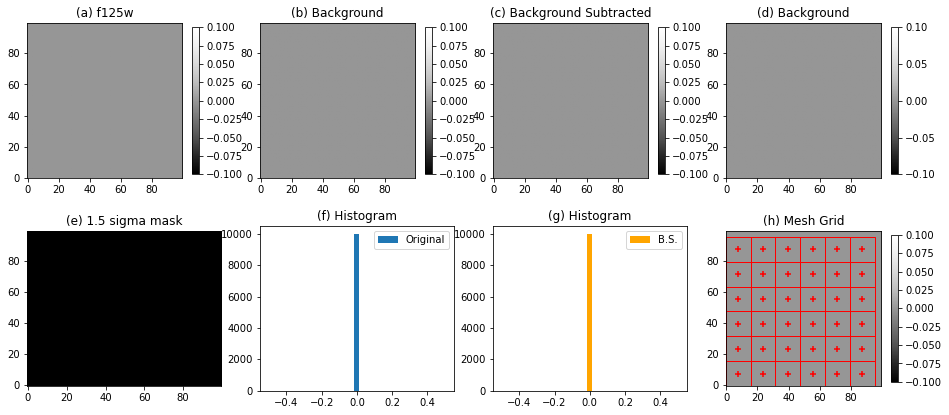


Background =  0.0

Background subtracted image saved to /Users/brian.merino/Desktop/JWST/RELICS/BS_files/bs/f125w_2868_bs.fits
Background saved to /Users/brian.merino/Desktop/JWST/RELICS/BS_files/bkg/f125w_2868_bkg.fits



        Use SegmentationImage.make_source_mask instead. [warnings]


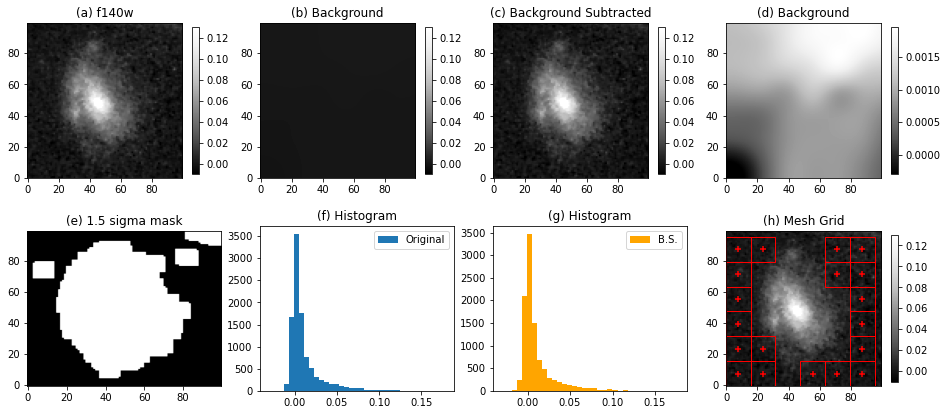


Background =  0.007620826739267815

Background subtracted image saved to /Users/brian.merino/Desktop/JWST/RELICS/BS_files/bs/f140w_2868_bs.fits
Background saved to /Users/brian.merino/Desktop/JWST/RELICS/BS_files/bkg/f140w_2868_bkg.fits



        Use SegmentationImage.make_source_mask instead. [warnings]


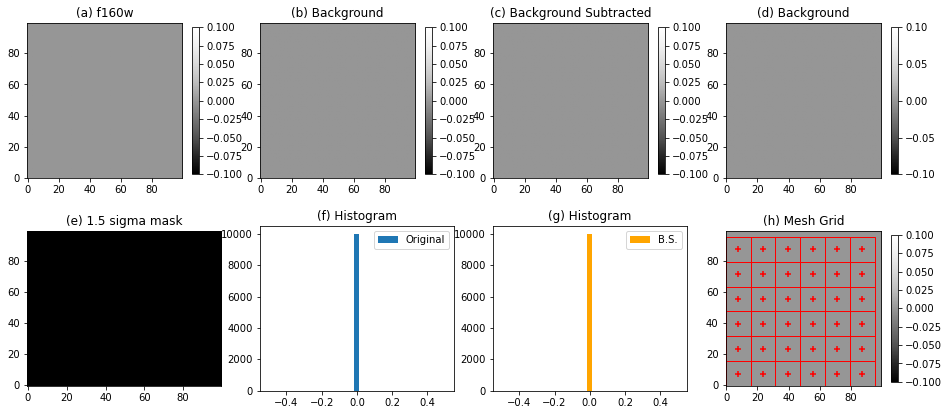


Background =  0.0

Background subtracted image saved to /Users/brian.merino/Desktop/JWST/RELICS/BS_files/bs/f160w_2868_bs.fits
Background saved to /Users/brian.merino/Desktop/JWST/RELICS/BS_files/bkg/f160w_2868_bkg.fits



        Use SegmentationImage.make_source_mask instead. [warnings]


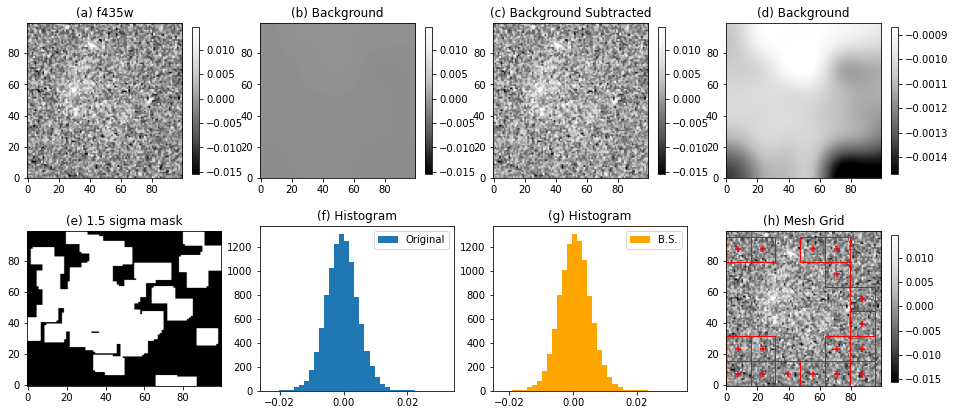


Background =  0.004762857059249057

Background subtracted image saved to /Users/brian.merino/Desktop/JWST/RELICS/BS_files/bs/f435w_2868_bs.fits
Background saved to /Users/brian.merino/Desktop/JWST/RELICS/BS_files/bkg/f435w_2868_bkg.fits



        Use SegmentationImage.make_source_mask instead. [warnings]


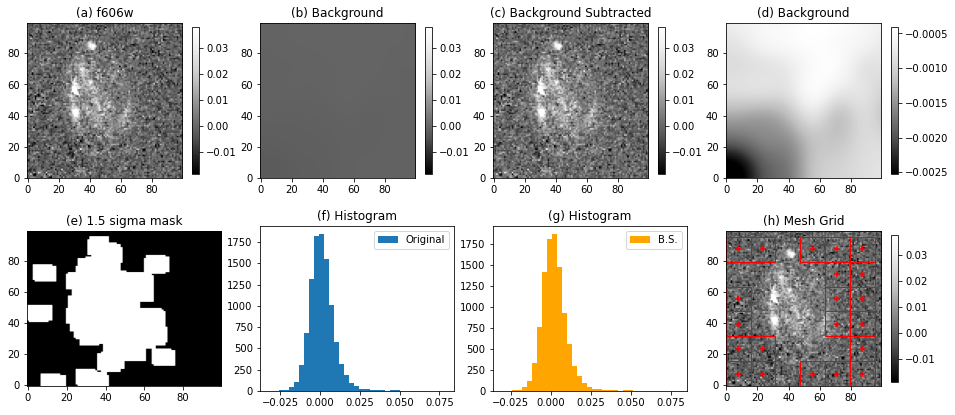


Background =  0.006647187027017597

Background subtracted image saved to /Users/brian.merino/Desktop/JWST/RELICS/BS_files/bs/f606w_2868_bs.fits
Background saved to /Users/brian.merino/Desktop/JWST/RELICS/BS_files/bkg/f606w_2868_bkg.fits



        Use SegmentationImage.make_source_mask instead. [warnings]


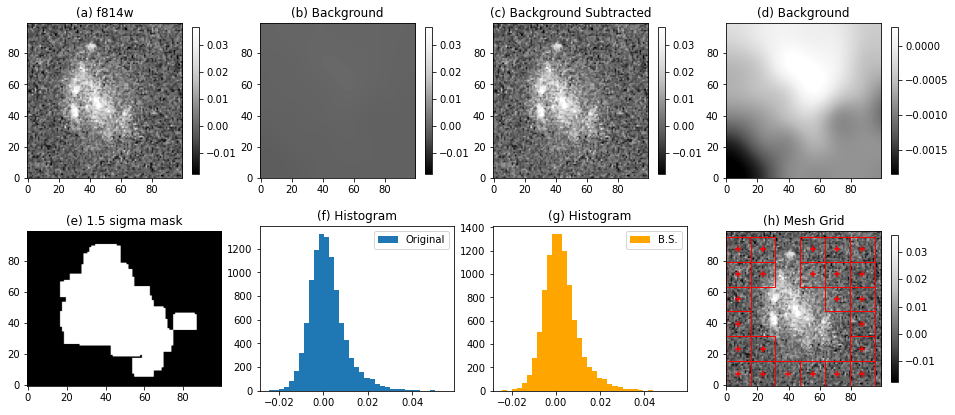


Background =  0.006828916436009387

Background subtracted image saved to /Users/brian.merino/Desktop/JWST/RELICS/BS_files/bs/f814w_2868_bs.fits
Background saved to /Users/brian.merino/Desktop/JWST/RELICS/BS_files/bkg/f814w_2868_bkg.fits



        Use SegmentationImage.make_source_mask instead. [warnings]


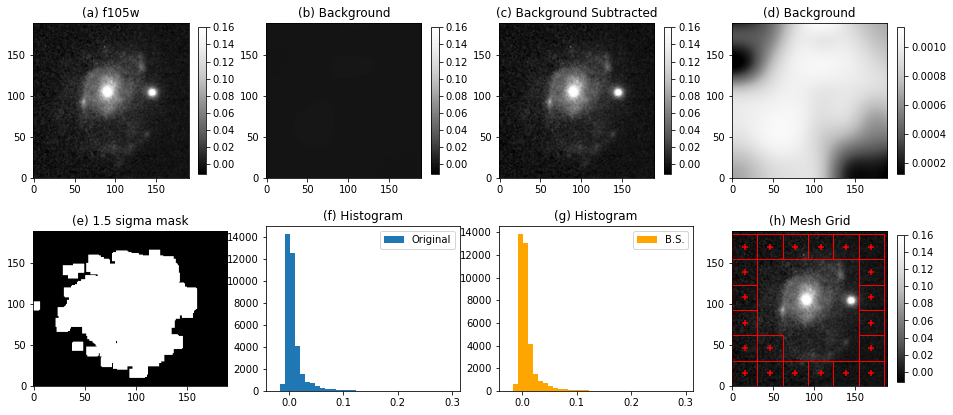


Background =  0.007209054397058963

Background subtracted image saved to /Users/brian.merino/Desktop/JWST/RELICS/BS_files/bs/f105w_2896_bs.fits
Background saved to /Users/brian.merino/Desktop/JWST/RELICS/BS_files/bkg/f105w_2896_bkg.fits



        Use SegmentationImage.make_source_mask instead. [warnings]


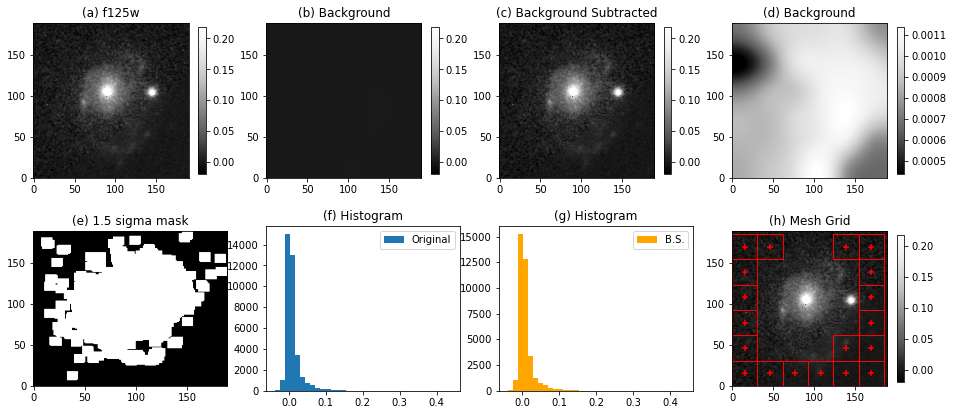


Background =  0.009462654544488223

Background subtracted image saved to /Users/brian.merino/Desktop/JWST/RELICS/BS_files/bs/f125w_2896_bs.fits
Background saved to /Users/brian.merino/Desktop/JWST/RELICS/BS_files/bkg/f125w_2896_bkg.fits



        Use SegmentationImage.make_source_mask instead. [warnings]


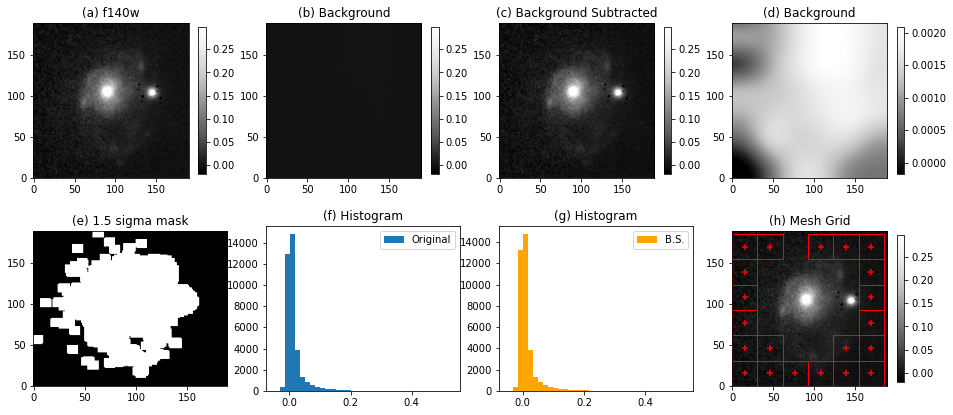


Background =  0.010458062267867663

Background subtracted image saved to /Users/brian.merino/Desktop/JWST/RELICS/BS_files/bs/f140w_2896_bs.fits
Background saved to /Users/brian.merino/Desktop/JWST/RELICS/BS_files/bkg/f140w_2896_bkg.fits



        Use SegmentationImage.make_source_mask instead. [warnings]


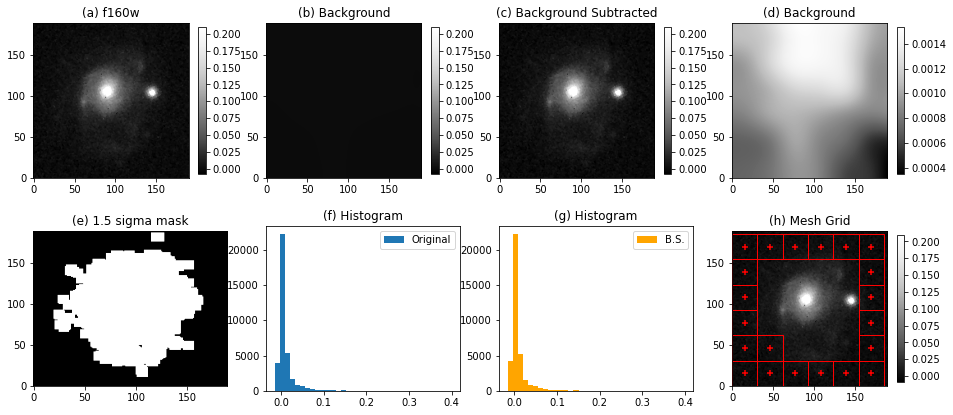


Background =  0.006751489836576121

Background subtracted image saved to /Users/brian.merino/Desktop/JWST/RELICS/BS_files/bs/f160w_2896_bs.fits
Background saved to /Users/brian.merino/Desktop/JWST/RELICS/BS_files/bkg/f160w_2896_bkg.fits



        Use SegmentationImage.make_source_mask instead. [warnings]


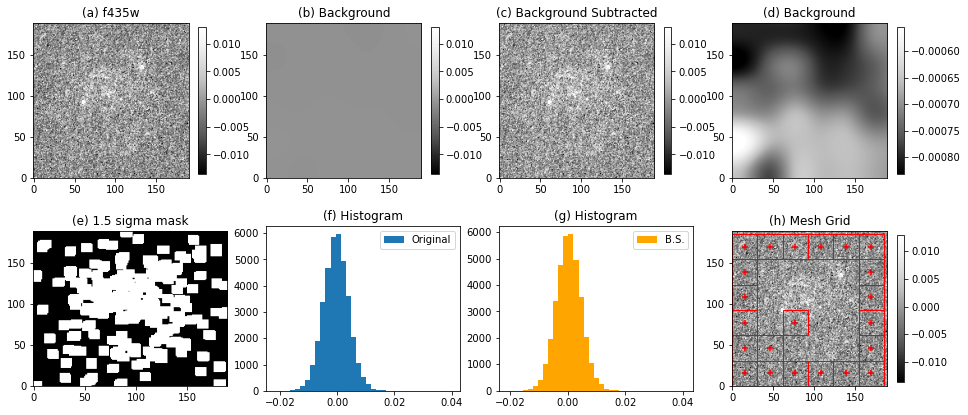


Background =  0.00421435461288181

Background subtracted image saved to /Users/brian.merino/Desktop/JWST/RELICS/BS_files/bs/f435w_2896_bs.fits
Background saved to /Users/brian.merino/Desktop/JWST/RELICS/BS_files/bkg/f435w_2896_bkg.fits



        Use SegmentationImage.make_source_mask instead. [warnings]


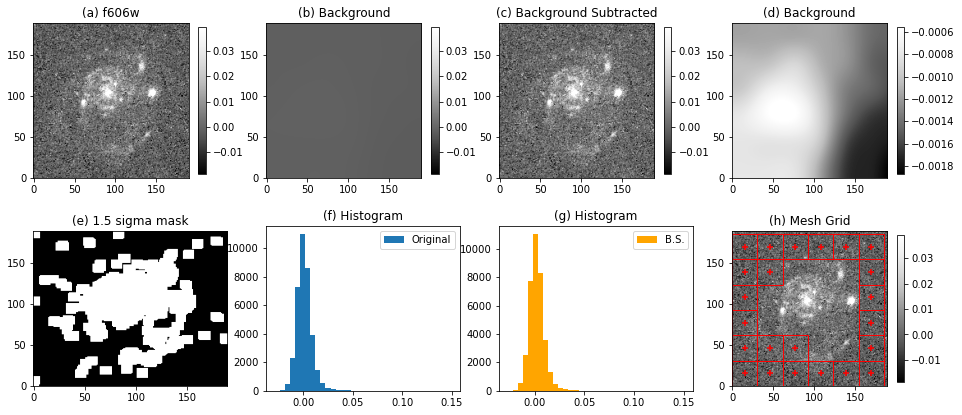


Background =  0.006530683637291753

Background subtracted image saved to /Users/brian.merino/Desktop/JWST/RELICS/BS_files/bs/f606w_2896_bs.fits
Background saved to /Users/brian.merino/Desktop/JWST/RELICS/BS_files/bkg/f606w_2896_bkg.fits



        Use SegmentationImage.make_source_mask instead. [warnings]


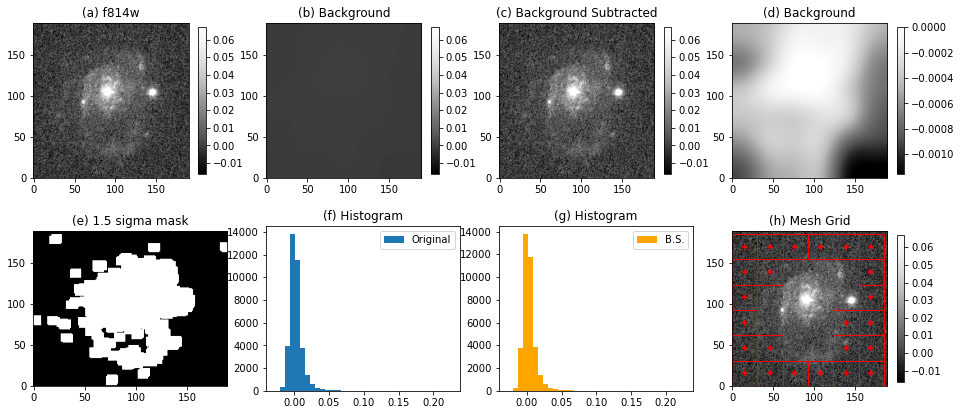


Background =  0.006754461277105781

Background subtracted image saved to /Users/brian.merino/Desktop/JWST/RELICS/BS_files/bs/f814w_2896_bs.fits
Background saved to /Users/brian.merino/Desktop/JWST/RELICS/BS_files/bkg/f814w_2896_bkg.fits



        Use SegmentationImage.make_source_mask instead. [warnings]


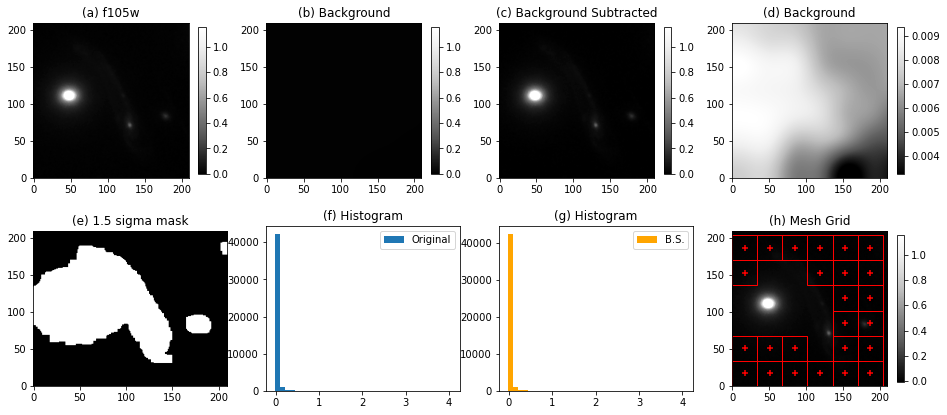


Background =  0.009508885160702812

Background subtracted image saved to /Users/brian.merino/Desktop/JWST/RELICS/BS_files/bs/f105w_3225_bs.fits
Background saved to /Users/brian.merino/Desktop/JWST/RELICS/BS_files/bkg/f105w_3225_bkg.fits



        Use SegmentationImage.make_source_mask instead. [warnings]


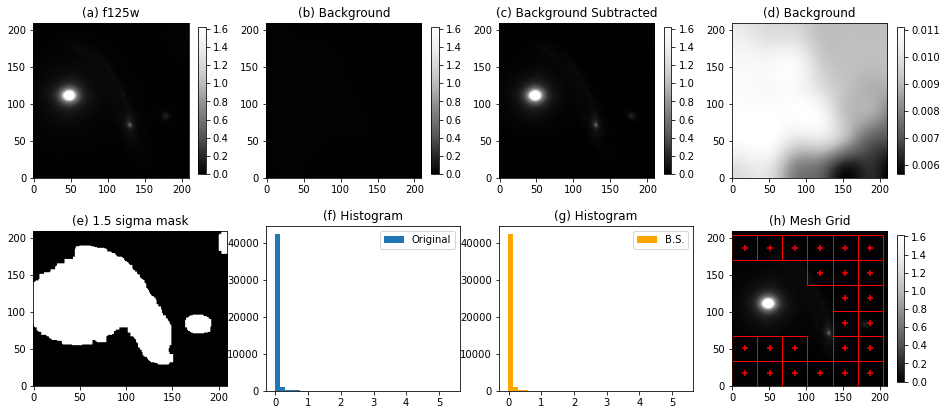


Background =  0.011838902556716276

Background subtracted image saved to /Users/brian.merino/Desktop/JWST/RELICS/BS_files/bs/f125w_3225_bs.fits
Background saved to /Users/brian.merino/Desktop/JWST/RELICS/BS_files/bkg/f125w_3225_bkg.fits



        Use SegmentationImage.make_source_mask instead. [warnings]


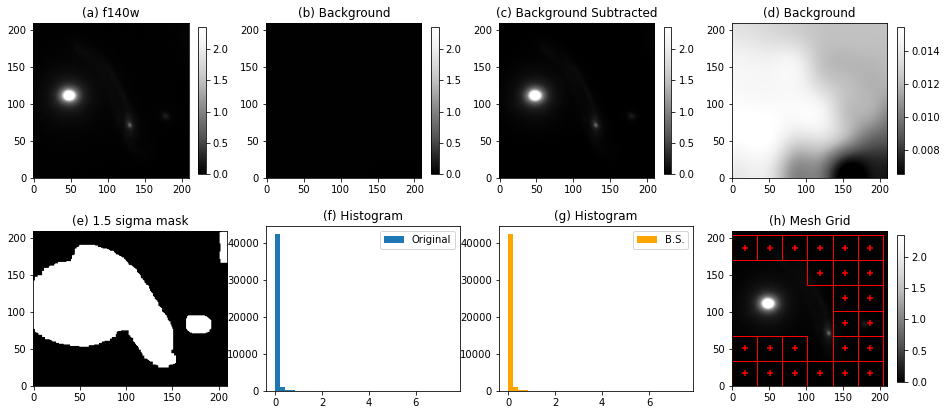


Background =  0.01645510860093073

Background subtracted image saved to /Users/brian.merino/Desktop/JWST/RELICS/BS_files/bs/f140w_3225_bs.fits
Background saved to /Users/brian.merino/Desktop/JWST/RELICS/BS_files/bkg/f140w_3225_bkg.fits



        Use SegmentationImage.make_source_mask instead. [warnings]


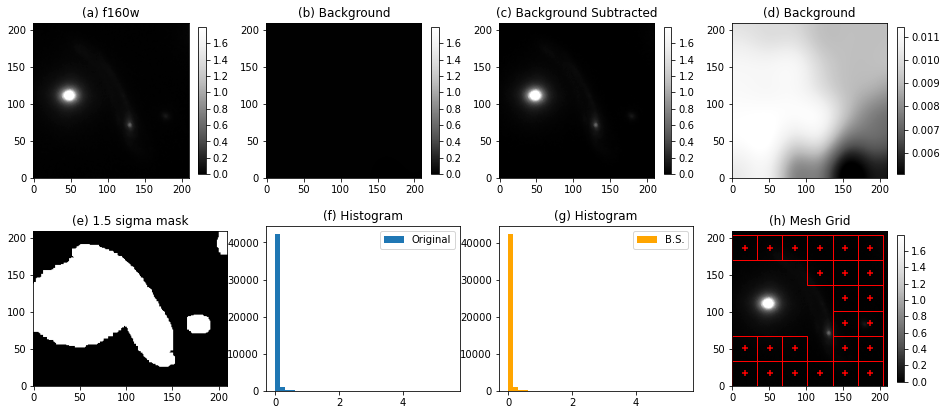


Background =  0.01219827426319066

Background subtracted image saved to /Users/brian.merino/Desktop/JWST/RELICS/BS_files/bs/f160w_3225_bs.fits
Background saved to /Users/brian.merino/Desktop/JWST/RELICS/BS_files/bkg/f160w_3225_bkg.fits



        Use SegmentationImage.make_source_mask instead. [warnings]


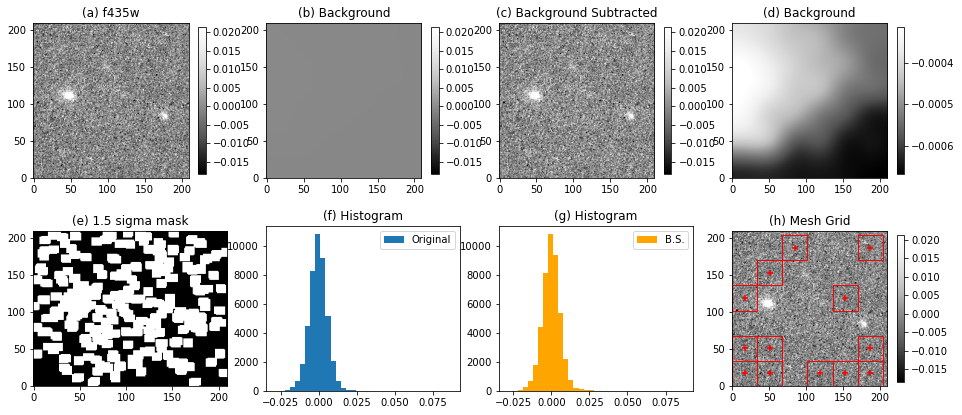


Background =  0.005336549437048789

Background subtracted image saved to /Users/brian.merino/Desktop/JWST/RELICS/BS_files/bs/f435w_3225_bs.fits
Background saved to /Users/brian.merino/Desktop/JWST/RELICS/BS_files/bkg/f435w_3225_bkg.fits



        Use SegmentationImage.make_source_mask instead. [warnings]


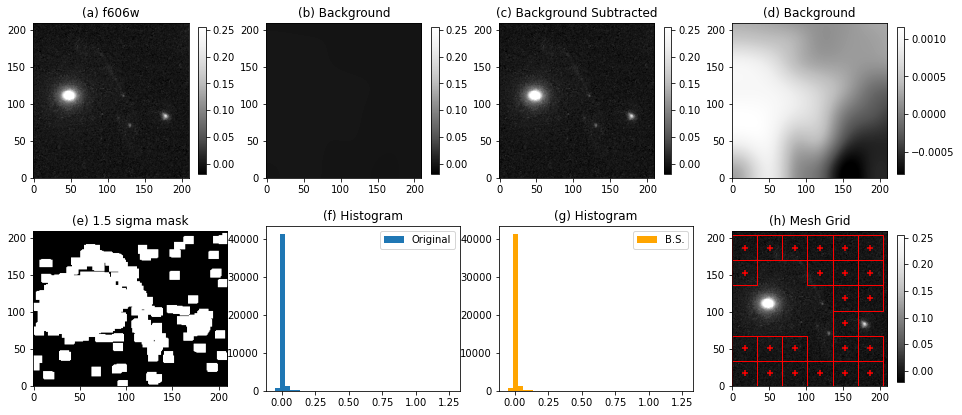


Background =  0.007745021078691709

Background subtracted image saved to /Users/brian.merino/Desktop/JWST/RELICS/BS_files/bs/f606w_3225_bs.fits
Background saved to /Users/brian.merino/Desktop/JWST/RELICS/BS_files/bkg/f606w_3225_bkg.fits



        Use SegmentationImage.make_source_mask instead. [warnings]


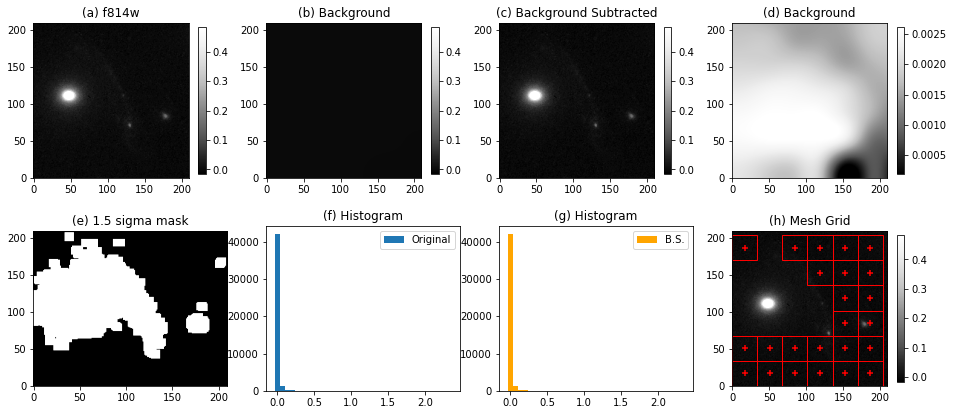


Background =  0.008666648154644649

Background subtracted image saved to /Users/brian.merino/Desktop/JWST/RELICS/BS_files/bs/f814w_3225_bs.fits
Background saved to /Users/brian.merino/Desktop/JWST/RELICS/BS_files/bkg/f814w_3225_bkg.fits



        Use SegmentationImage.make_source_mask instead. [warnings]


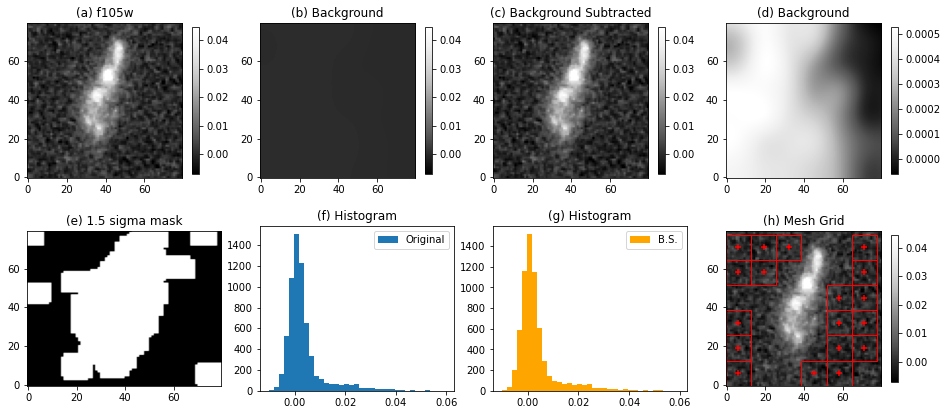


Background =  0.0035350345662353527

Background subtracted image saved to /Users/brian.merino/Desktop/JWST/RELICS/BS_files/bs/f105w_4021_bs.fits
Background saved to /Users/brian.merino/Desktop/JWST/RELICS/BS_files/bkg/f105w_4021_bkg.fits



        Use SegmentationImage.make_source_mask instead. [warnings]


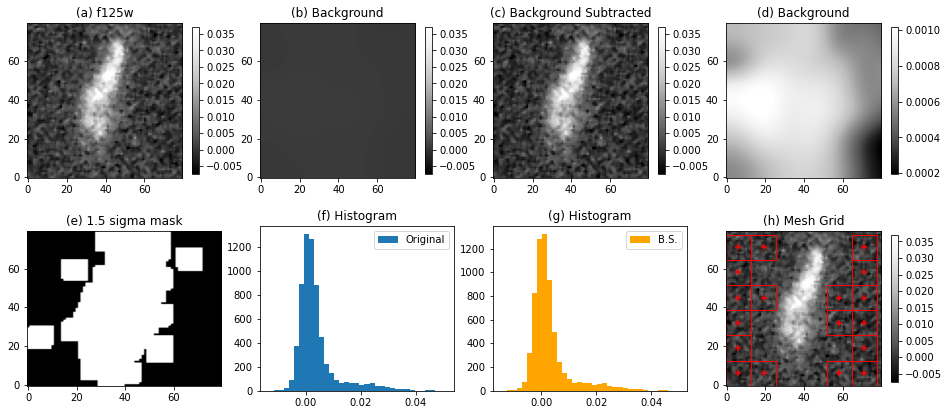


Background =  0.0036337797326099182

Background subtracted image saved to /Users/brian.merino/Desktop/JWST/RELICS/BS_files/bs/f125w_4021_bs.fits
Background saved to /Users/brian.merino/Desktop/JWST/RELICS/BS_files/bkg/f125w_4021_bkg.fits



        Use SegmentationImage.make_source_mask instead. [warnings]


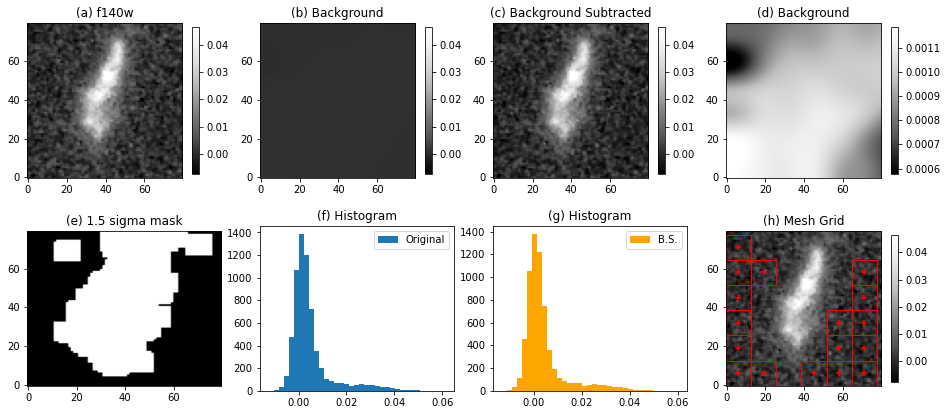


Background =  0.004049700976273926

Background subtracted image saved to /Users/brian.merino/Desktop/JWST/RELICS/BS_files/bs/f140w_4021_bs.fits
Background saved to /Users/brian.merino/Desktop/JWST/RELICS/BS_files/bkg/f140w_4021_bkg.fits



        Use SegmentationImage.make_source_mask instead. [warnings]


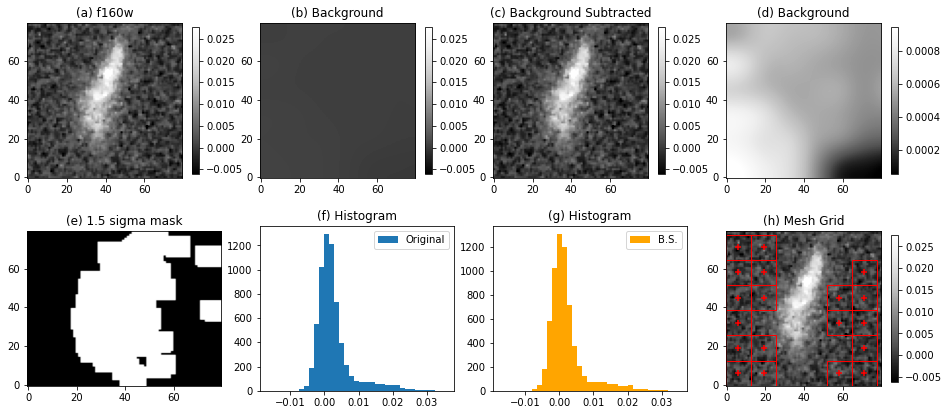


Background =  0.0029888183478685632

Background subtracted image saved to /Users/brian.merino/Desktop/JWST/RELICS/BS_files/bs/f160w_4021_bs.fits
Background saved to /Users/brian.merino/Desktop/JWST/RELICS/BS_files/bkg/f160w_4021_bkg.fits



        Use SegmentationImage.make_source_mask instead. [warnings]


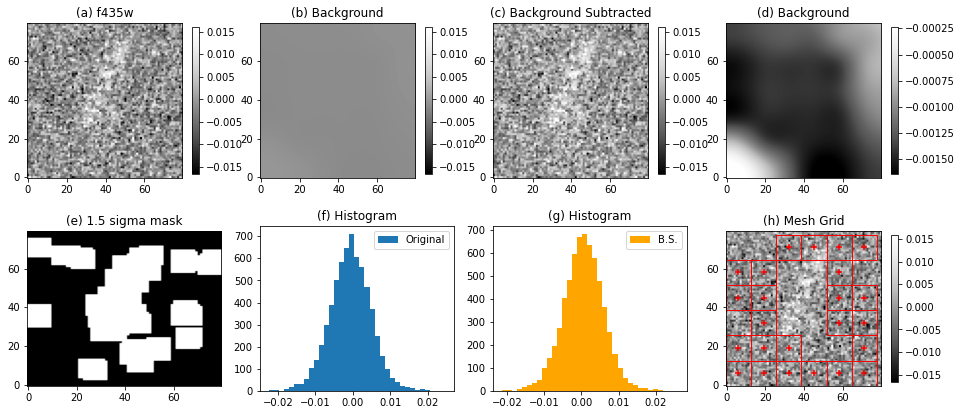


Background =  0.0051234814792088185

Background subtracted image saved to /Users/brian.merino/Desktop/JWST/RELICS/BS_files/bs/f435w_4021_bs.fits
Background saved to /Users/brian.merino/Desktop/JWST/RELICS/BS_files/bkg/f435w_4021_bkg.fits



        Use SegmentationImage.make_source_mask instead. [warnings]


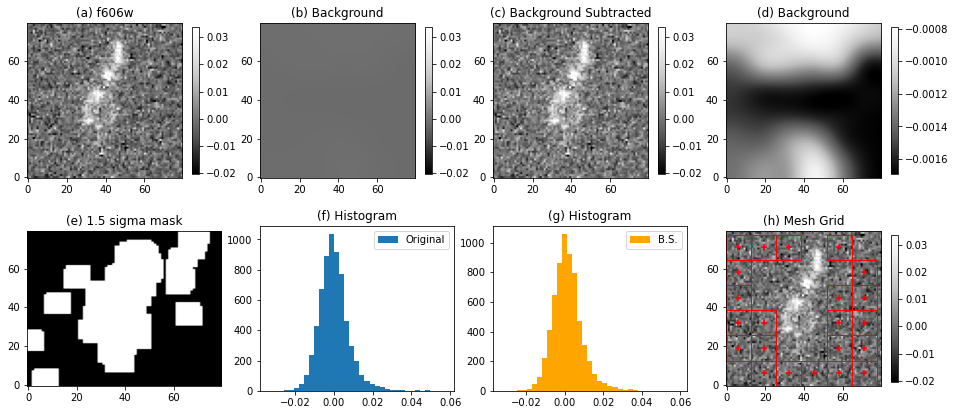


Background =  0.006603010322414472

Background subtracted image saved to /Users/brian.merino/Desktop/JWST/RELICS/BS_files/bs/f606w_4021_bs.fits
Background saved to /Users/brian.merino/Desktop/JWST/RELICS/BS_files/bkg/f606w_4021_bkg.fits



        Use SegmentationImage.make_source_mask instead. [warnings]


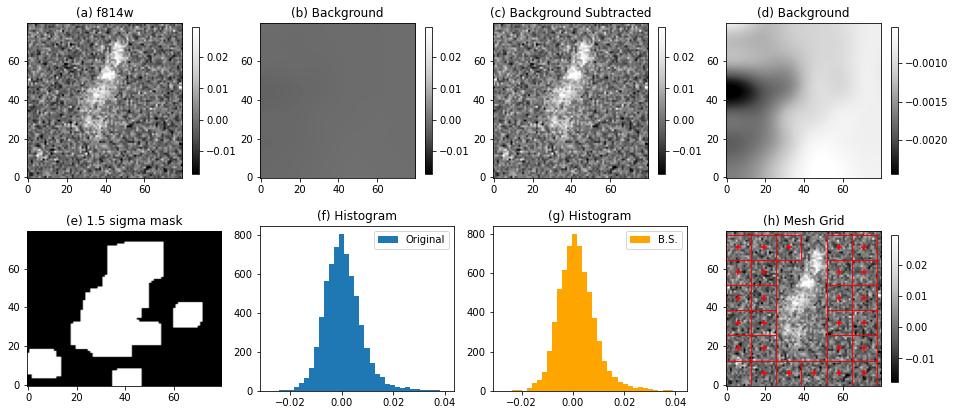


Background =  0.006558673447225176

Background subtracted image saved to /Users/brian.merino/Desktop/JWST/RELICS/BS_files/bs/f814w_4021_bs.fits
Background saved to /Users/brian.merino/Desktop/JWST/RELICS/BS_files/bkg/f814w_4021_bkg.fits



        Use SegmentationImage.make_source_mask instead. [warnings]


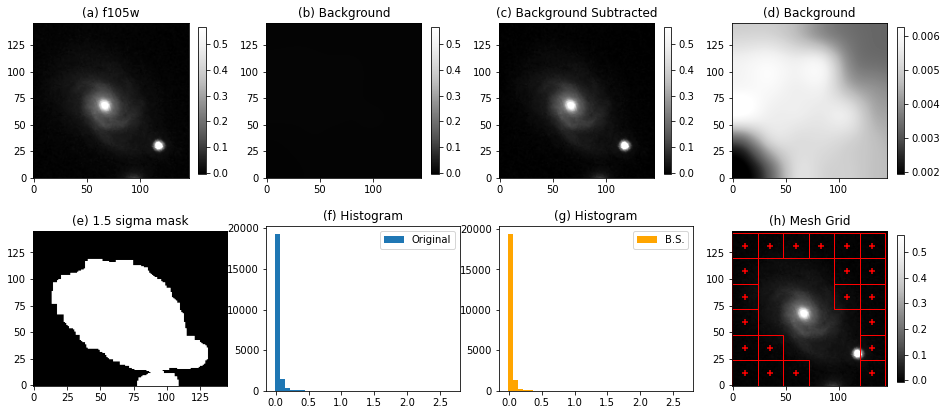


Background =  0.012110141778930853

Background subtracted image saved to /Users/brian.merino/Desktop/JWST/RELICS/BS_files/bs/f105w_4193_bs.fits
Background saved to /Users/brian.merino/Desktop/JWST/RELICS/BS_files/bkg/f105w_4193_bkg.fits



        Use SegmentationImage.make_source_mask instead. [warnings]


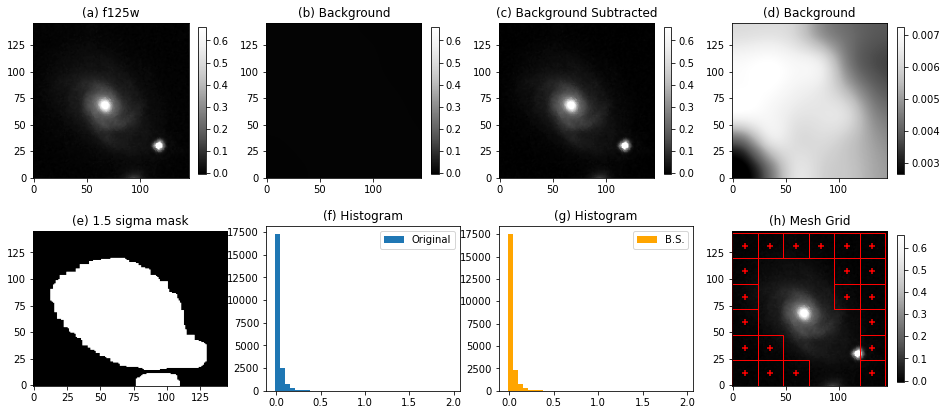


Background =  0.014390970926009224

Background subtracted image saved to /Users/brian.merino/Desktop/JWST/RELICS/BS_files/bs/f125w_4193_bs.fits
Background saved to /Users/brian.merino/Desktop/JWST/RELICS/BS_files/bkg/f125w_4193_bkg.fits



        Use SegmentationImage.make_source_mask instead. [warnings]


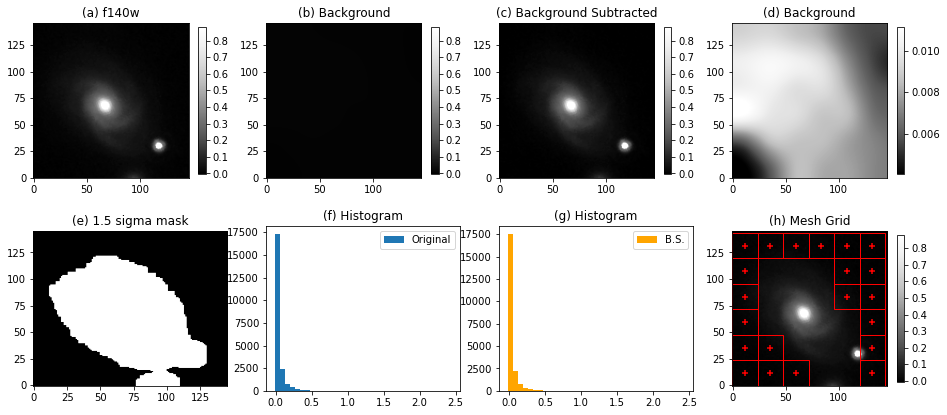


Background =  0.018821140215166704

Background subtracted image saved to /Users/brian.merino/Desktop/JWST/RELICS/BS_files/bs/f140w_4193_bs.fits
Background saved to /Users/brian.merino/Desktop/JWST/RELICS/BS_files/bkg/f140w_4193_bkg.fits



        Use SegmentationImage.make_source_mask instead. [warnings]


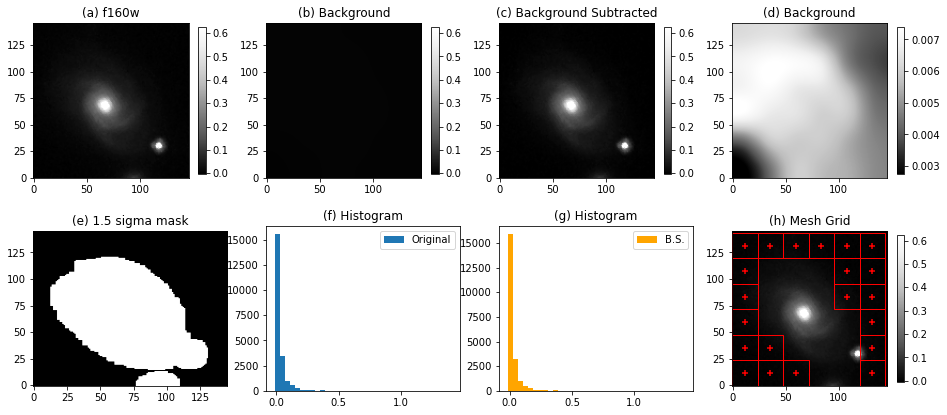


Background =  0.013328799683814686

Background subtracted image saved to /Users/brian.merino/Desktop/JWST/RELICS/BS_files/bs/f160w_4193_bs.fits
Background saved to /Users/brian.merino/Desktop/JWST/RELICS/BS_files/bkg/f160w_4193_bkg.fits



        Use SegmentationImage.make_source_mask instead. [warnings]


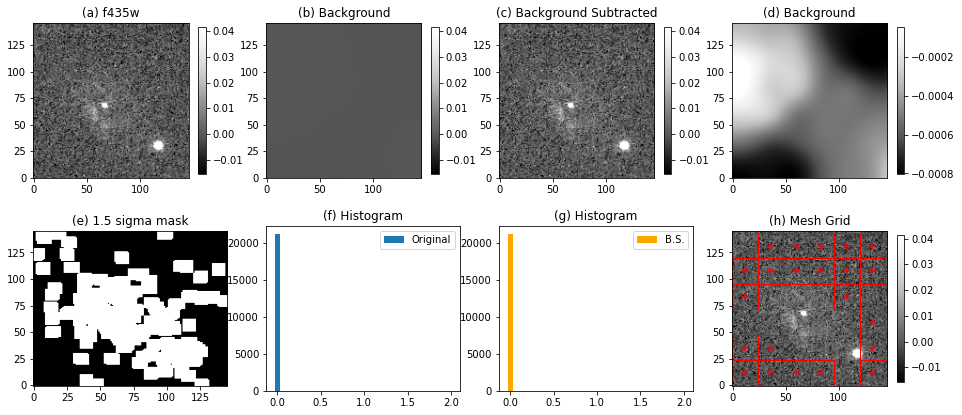


Background =  0.005151213773501544

Background subtracted image saved to /Users/brian.merino/Desktop/JWST/RELICS/BS_files/bs/f435w_4193_bs.fits
Background saved to /Users/brian.merino/Desktop/JWST/RELICS/BS_files/bkg/f435w_4193_bkg.fits



        Use SegmentationImage.make_source_mask instead. [warnings]


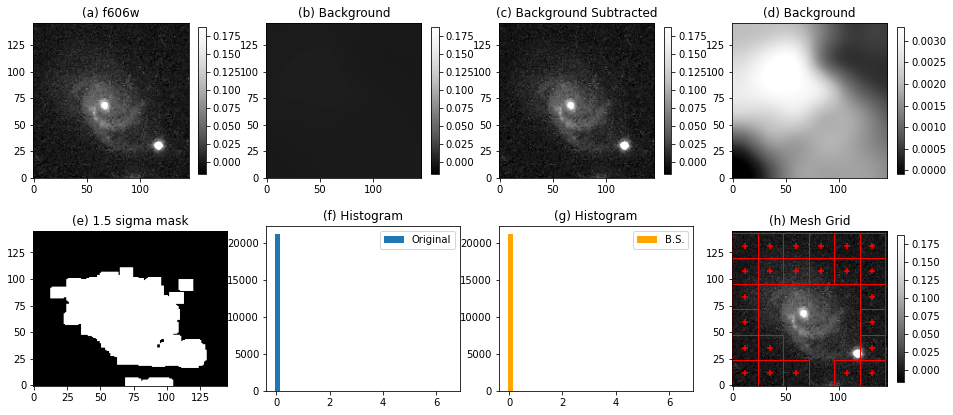


Background =  0.01017670813505828

Background subtracted image saved to /Users/brian.merino/Desktop/JWST/RELICS/BS_files/bs/f606w_4193_bs.fits
Background saved to /Users/brian.merino/Desktop/JWST/RELICS/BS_files/bkg/f606w_4193_bkg.fits



        Use SegmentationImage.make_source_mask instead. [warnings]


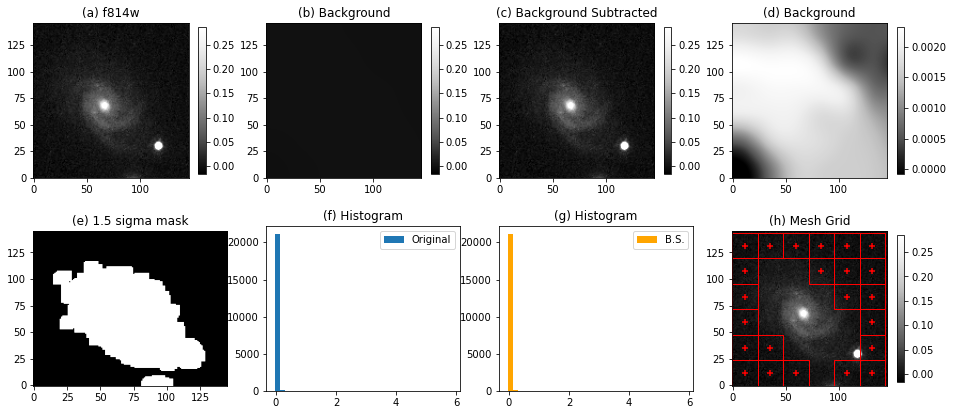


Background =  0.010452376212058584

Background subtracted image saved to /Users/brian.merino/Desktop/JWST/RELICS/BS_files/bs/f814w_4193_bs.fits
Background saved to /Users/brian.merino/Desktop/JWST/RELICS/BS_files/bkg/f814w_4193_bkg.fits



        Use SegmentationImage.make_source_mask instead. [warnings]


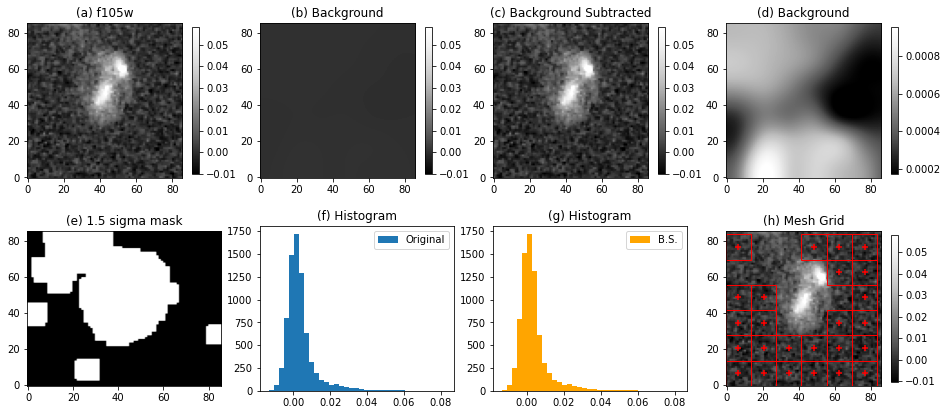


Background =  0.004767831667691543

Background subtracted image saved to /Users/brian.merino/Desktop/JWST/RELICS/BS_files/bs/f105w_4878_bs.fits
Background saved to /Users/brian.merino/Desktop/JWST/RELICS/BS_files/bkg/f105w_4878_bkg.fits



        Use SegmentationImage.make_source_mask instead. [warnings]


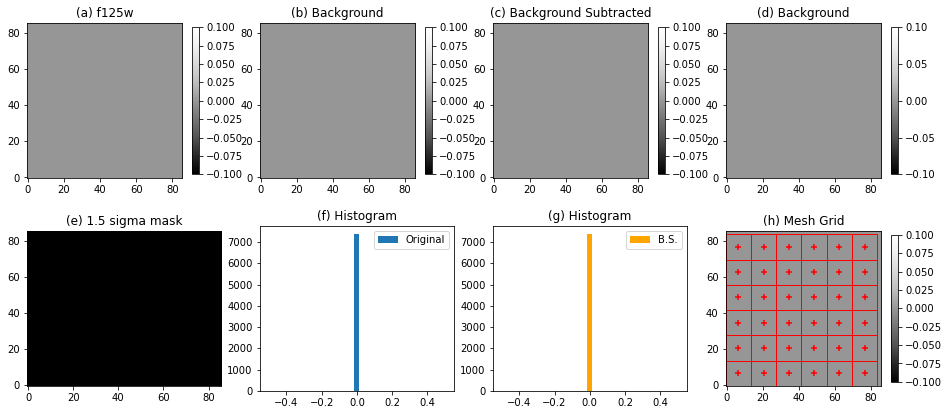


Background =  0.0

Background subtracted image saved to /Users/brian.merino/Desktop/JWST/RELICS/BS_files/bs/f125w_4878_bs.fits
Background saved to /Users/brian.merino/Desktop/JWST/RELICS/BS_files/bkg/f125w_4878_bkg.fits



        Use SegmentationImage.make_source_mask instead. [warnings]


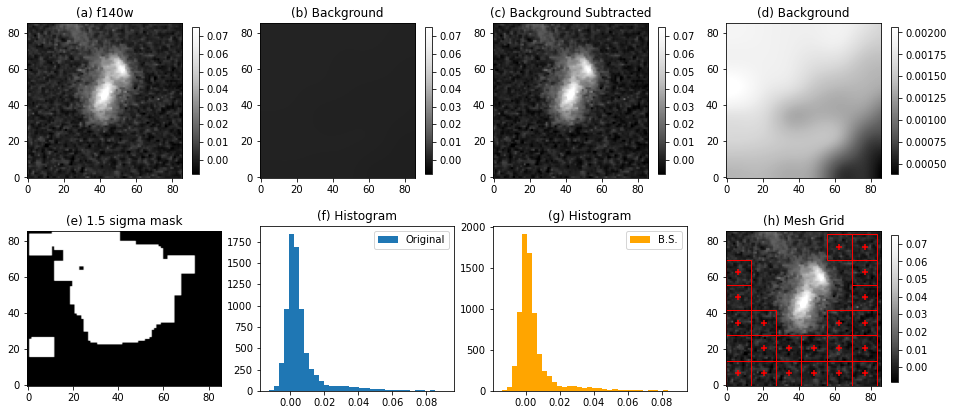


Background =  0.00479449523755585

Background subtracted image saved to /Users/brian.merino/Desktop/JWST/RELICS/BS_files/bs/f140w_4878_bs.fits
Background saved to /Users/brian.merino/Desktop/JWST/RELICS/BS_files/bkg/f140w_4878_bkg.fits



        Use SegmentationImage.make_source_mask instead. [warnings]


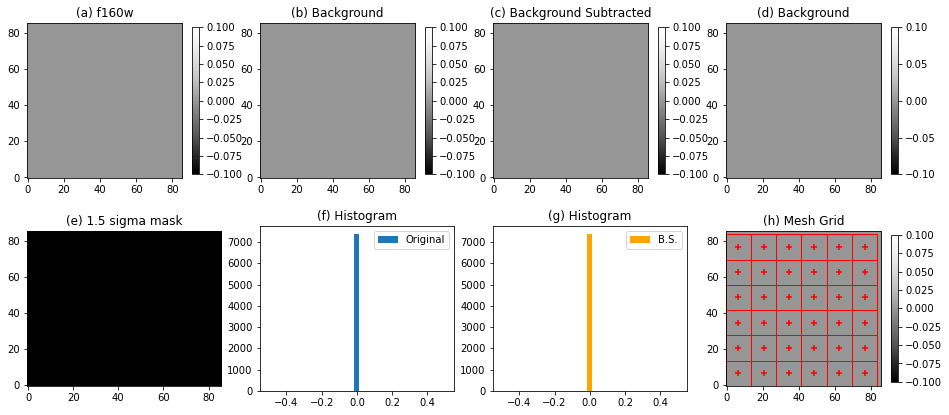


Background =  0.0

Background subtracted image saved to /Users/brian.merino/Desktop/JWST/RELICS/BS_files/bs/f160w_4878_bs.fits
Background saved to /Users/brian.merino/Desktop/JWST/RELICS/BS_files/bkg/f160w_4878_bkg.fits



        Use SegmentationImage.make_source_mask instead. [warnings]


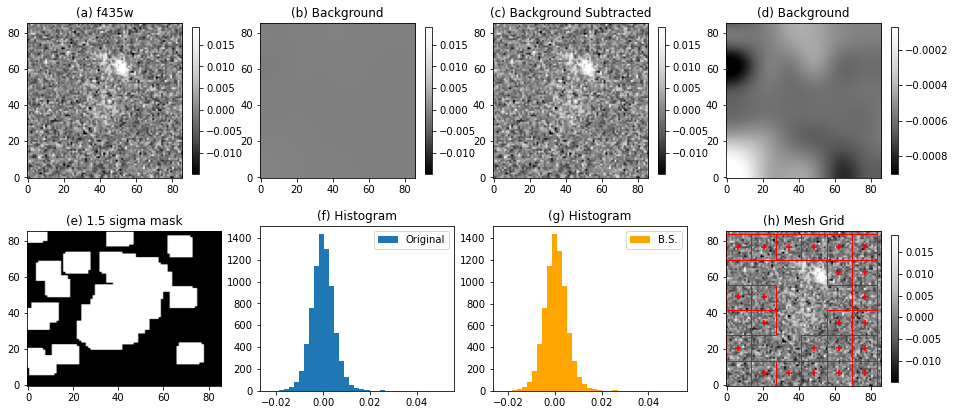


Background =  0.0044575985020393035

Background subtracted image saved to /Users/brian.merino/Desktop/JWST/RELICS/BS_files/bs/f435w_4878_bs.fits
Background saved to /Users/brian.merino/Desktop/JWST/RELICS/BS_files/bkg/f435w_4878_bkg.fits



        Use SegmentationImage.make_source_mask instead. [warnings]


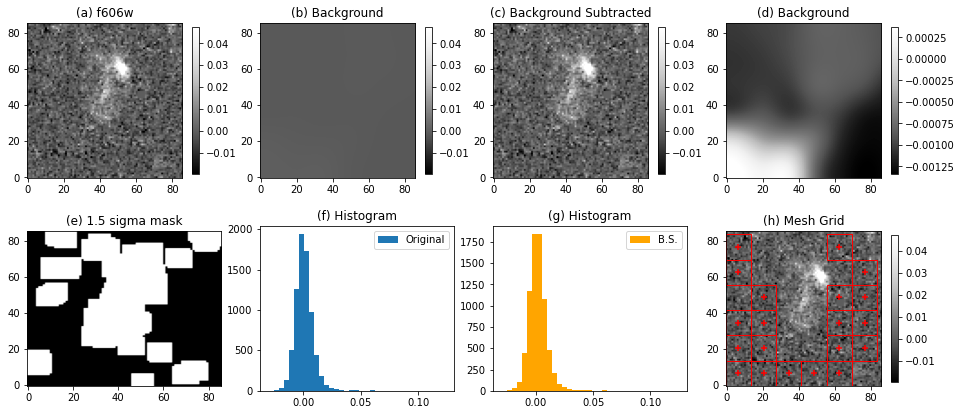


Background =  0.006513164979429275

Background subtracted image saved to /Users/brian.merino/Desktop/JWST/RELICS/BS_files/bs/f606w_4878_bs.fits
Background saved to /Users/brian.merino/Desktop/JWST/RELICS/BS_files/bkg/f606w_4878_bkg.fits



        Use SegmentationImage.make_source_mask instead. [warnings]


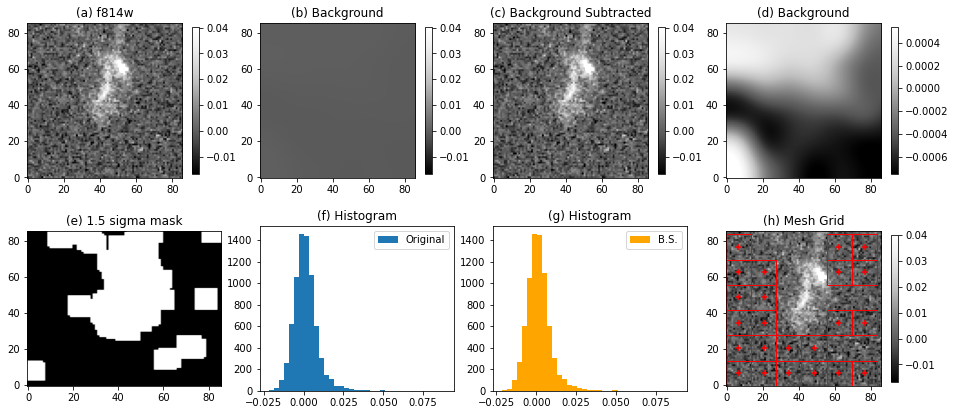


Background =  0.006199368018234726

Background subtracted image saved to /Users/brian.merino/Desktop/JWST/RELICS/BS_files/bs/f814w_4878_bs.fits
Background saved to /Users/brian.merino/Desktop/JWST/RELICS/BS_files/bkg/f814w_4878_bkg.fits



        Use SegmentationImage.make_source_mask instead. [warnings]


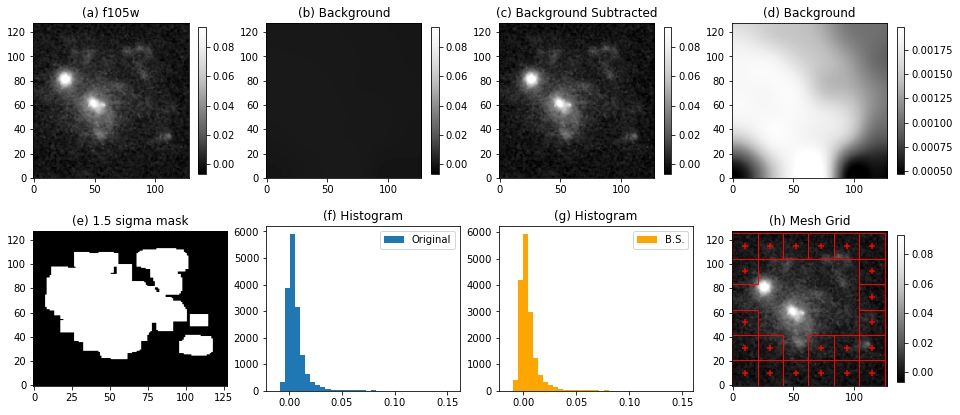


Background =  0.005321555191894651

Background subtracted image saved to /Users/brian.merino/Desktop/JWST/RELICS/BS_files/bs/f105w_5276_bs.fits
Background saved to /Users/brian.merino/Desktop/JWST/RELICS/BS_files/bkg/f105w_5276_bkg.fits



        Use SegmentationImage.make_source_mask instead. [warnings]


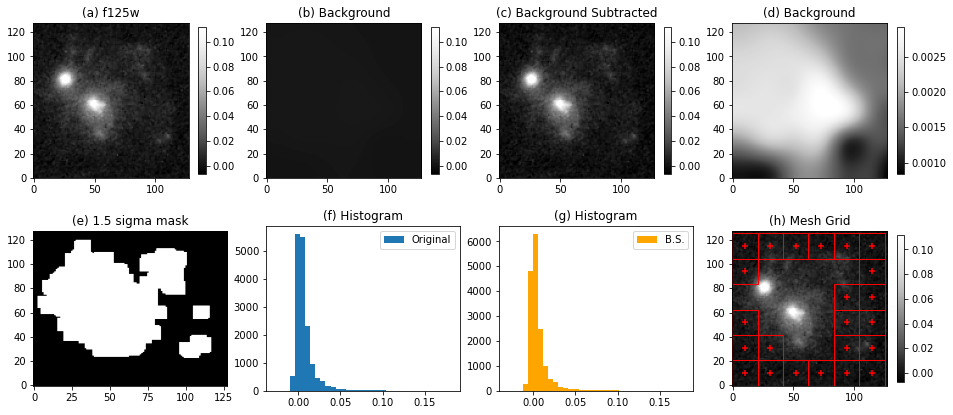


Background =  0.005918746389700893

Background subtracted image saved to /Users/brian.merino/Desktop/JWST/RELICS/BS_files/bs/f125w_5276_bs.fits
Background saved to /Users/brian.merino/Desktop/JWST/RELICS/BS_files/bkg/f125w_5276_bkg.fits



        Use SegmentationImage.make_source_mask instead. [warnings]


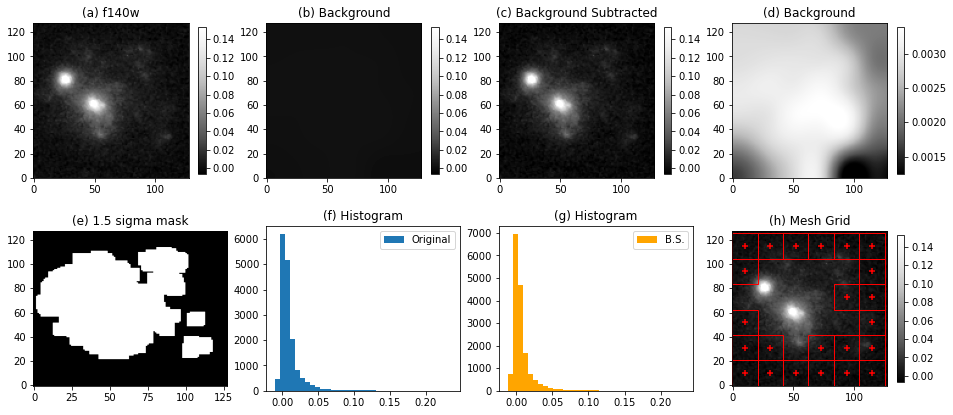


Background =  0.00681722605439026

Background subtracted image saved to /Users/brian.merino/Desktop/JWST/RELICS/BS_files/bs/f140w_5276_bs.fits
Background saved to /Users/brian.merino/Desktop/JWST/RELICS/BS_files/bkg/f140w_5276_bkg.fits



        Use SegmentationImage.make_source_mask instead. [warnings]


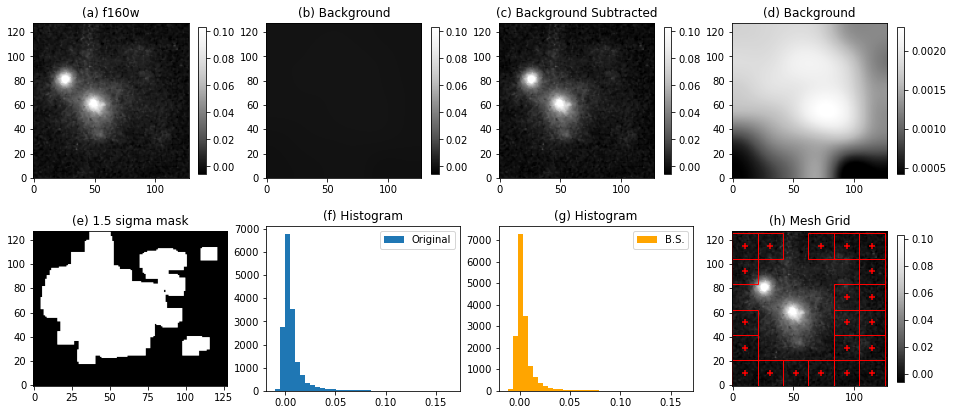


Background =  0.005005673596713274

Background subtracted image saved to /Users/brian.merino/Desktop/JWST/RELICS/BS_files/bs/f160w_5276_bs.fits
Background saved to /Users/brian.merino/Desktop/JWST/RELICS/BS_files/bkg/f160w_5276_bkg.fits



        Use SegmentationImage.make_source_mask instead. [warnings]


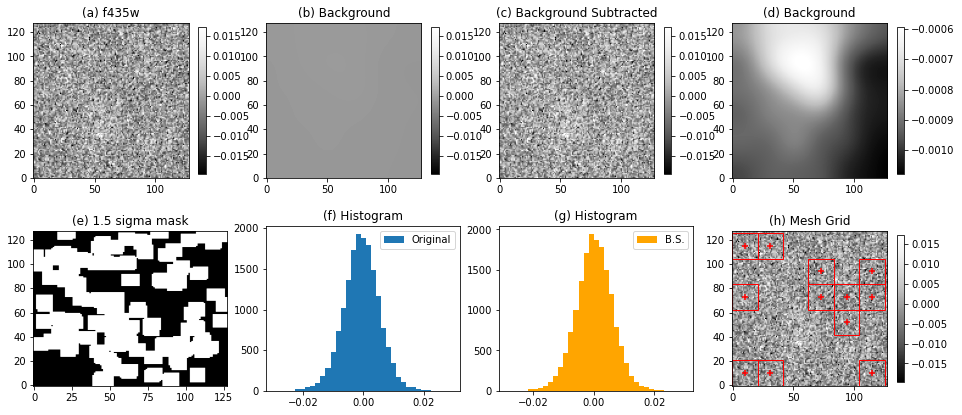


Background =  0.005665066558385795

Background subtracted image saved to /Users/brian.merino/Desktop/JWST/RELICS/BS_files/bs/f435w_5276_bs.fits
Background saved to /Users/brian.merino/Desktop/JWST/RELICS/BS_files/bkg/f435w_5276_bkg.fits



        Use SegmentationImage.make_source_mask instead. [warnings]


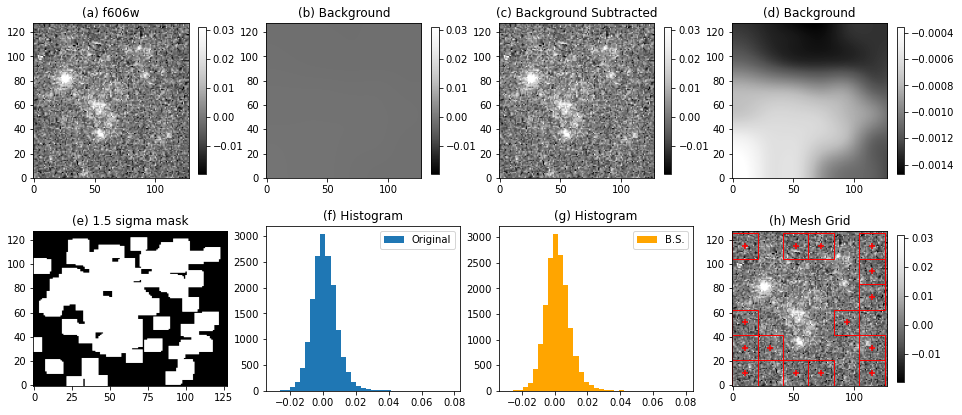


Background =  0.006719081527713836

Background subtracted image saved to /Users/brian.merino/Desktop/JWST/RELICS/BS_files/bs/f606w_5276_bs.fits
Background saved to /Users/brian.merino/Desktop/JWST/RELICS/BS_files/bkg/f606w_5276_bkg.fits



        Use SegmentationImage.make_source_mask instead. [warnings]


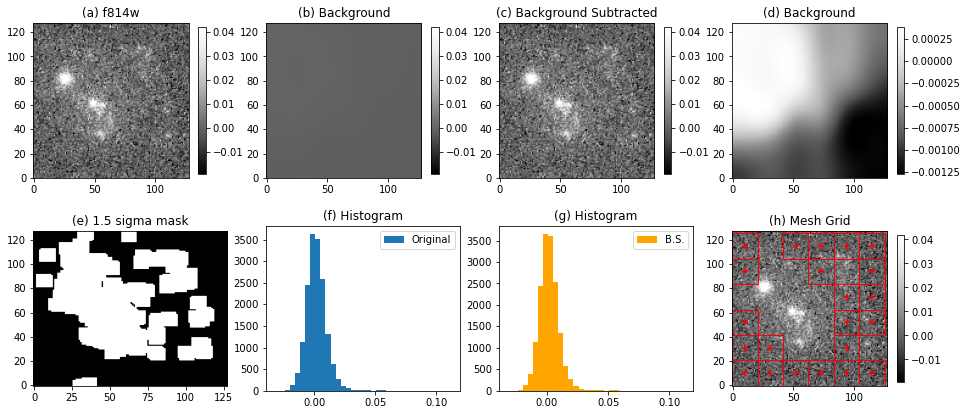


Background =  0.007149658725207741

Background subtracted image saved to /Users/brian.merino/Desktop/JWST/RELICS/BS_files/bs/f814w_5276_bs.fits
Background saved to /Users/brian.merino/Desktop/JWST/RELICS/BS_files/bkg/f814w_5276_bkg.fits



        Use SegmentationImage.make_source_mask instead. [warnings]


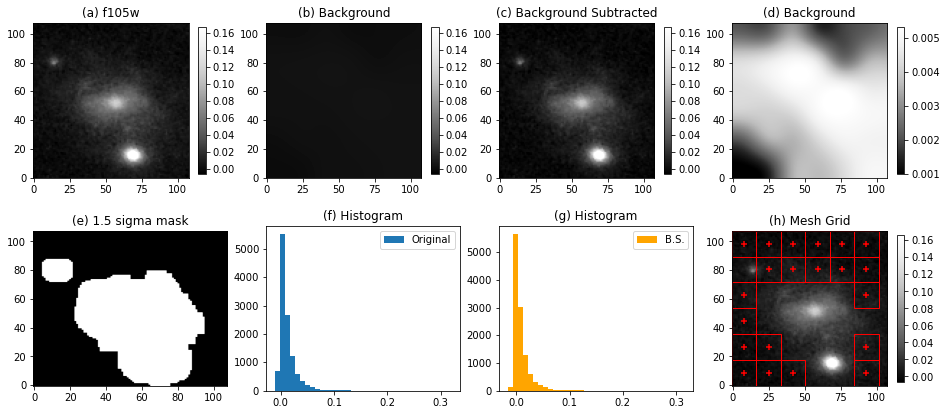


Background =  0.00876263037840776

Background subtracted image saved to /Users/brian.merino/Desktop/JWST/RELICS/BS_files/bs/f105w_5364_bs.fits
Background saved to /Users/brian.merino/Desktop/JWST/RELICS/BS_files/bkg/f105w_5364_bkg.fits



        Use SegmentationImage.make_source_mask instead. [warnings]


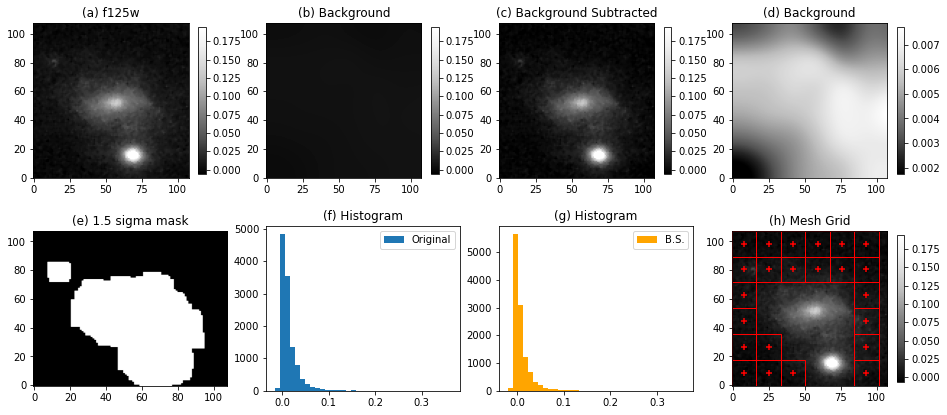


Background =  0.009524365785934352

Background subtracted image saved to /Users/brian.merino/Desktop/JWST/RELICS/BS_files/bs/f125w_5364_bs.fits
Background saved to /Users/brian.merino/Desktop/JWST/RELICS/BS_files/bkg/f125w_5364_bkg.fits



        Use SegmentationImage.make_source_mask instead. [warnings]


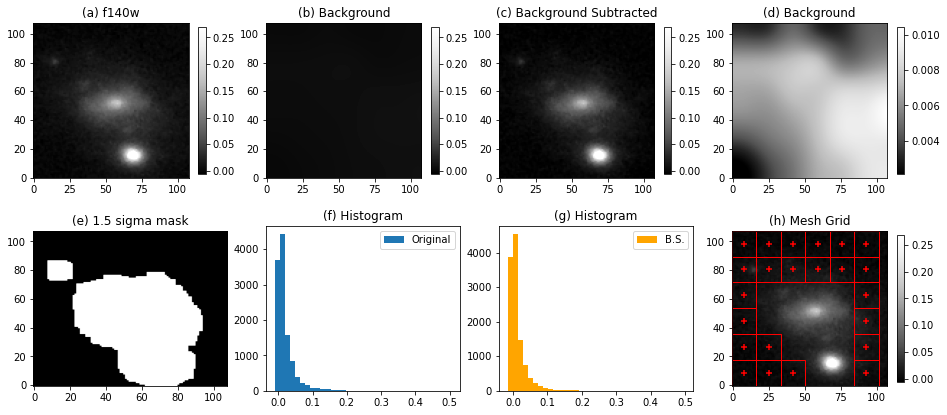


Background =  0.012186113725669884

Background subtracted image saved to /Users/brian.merino/Desktop/JWST/RELICS/BS_files/bs/f140w_5364_bs.fits
Background saved to /Users/brian.merino/Desktop/JWST/RELICS/BS_files/bkg/f140w_5364_bkg.fits



        Use SegmentationImage.make_source_mask instead. [warnings]


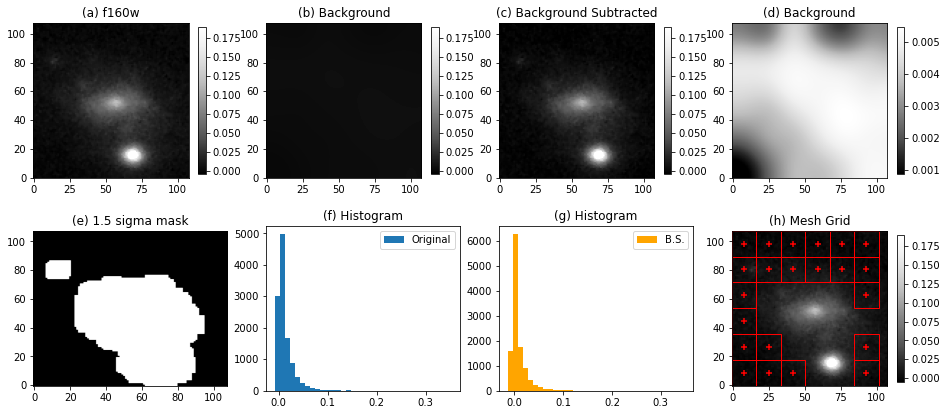


Background =  0.00832363732123529

Background subtracted image saved to /Users/brian.merino/Desktop/JWST/RELICS/BS_files/bs/f160w_5364_bs.fits
Background saved to /Users/brian.merino/Desktop/JWST/RELICS/BS_files/bkg/f160w_5364_bkg.fits



        Use SegmentationImage.make_source_mask instead. [warnings]


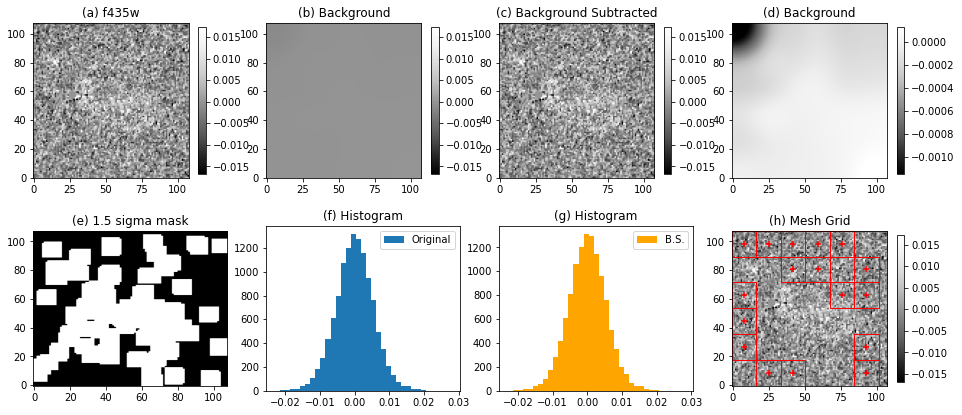


Background =  0.0052023271762277525

Background subtracted image saved to /Users/brian.merino/Desktop/JWST/RELICS/BS_files/bs/f435w_5364_bs.fits
Background saved to /Users/brian.merino/Desktop/JWST/RELICS/BS_files/bkg/f435w_5364_bkg.fits



        Use SegmentationImage.make_source_mask instead. [warnings]


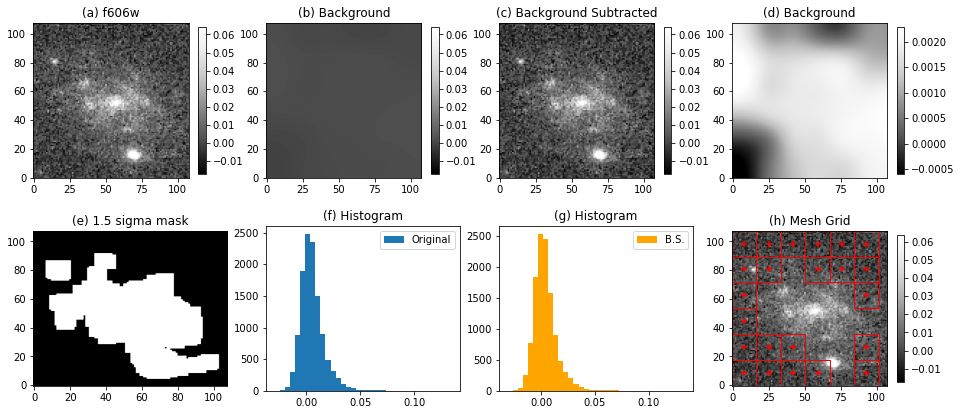


Background =  0.008646333415428751

Background subtracted image saved to /Users/brian.merino/Desktop/JWST/RELICS/BS_files/bs/f606w_5364_bs.fits
Background saved to /Users/brian.merino/Desktop/JWST/RELICS/BS_files/bkg/f606w_5364_bkg.fits



        Use SegmentationImage.make_source_mask instead. [warnings]


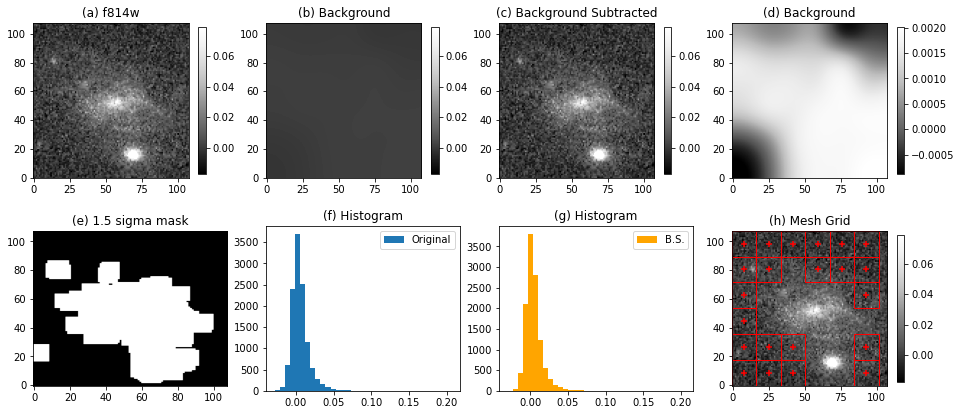


Background =  0.008591638612203563

Background subtracted image saved to /Users/brian.merino/Desktop/JWST/RELICS/BS_files/bs/f814w_5364_bs.fits
Background saved to /Users/brian.merino/Desktop/JWST/RELICS/BS_files/bkg/f814w_5364_bkg.fits

DONE!

123.45 seconds
2.058 minutes


In [17]:
root     = '/Users/brian.merino/Desktop/JWST/RELICS/BS_files/'
sci_root = '/Users/brian.merino/Desktop/JWST/RELICS/thumbnails/sci/'

for i in range(len(catalog)):
    cluster = 'smacs0723'
    ID      = catalog['ID'][i]
    
    for item in FILTER:
        save_bs  = root + 'bs/%s_%s_bs.fits'%(item,ID)
        save_bkg = root + 'bkg/%s_%s_bkg.fits'%(item,ID)
        save_png = root + '%s_%s_bs.png'%(item,ID)

        #Read in the fits files
        image = sci_root + '%s-%s.fits'%(item,ID)

        # Open the fits files
        pf = astropy.io.fits.open(image)

        # Read the headers
        head = pf[0].header

        # Access the data
        data = pf[0].data

        # This will adjust the strech for the plot
        norm = simple_norm(data, 'linear', percent=99.5)

        # Call the Background function
        # Background(image, head, name, norm, sigma)
        Background(data, head, '%s'%(item) , norm, sigma)

        print()
        print('Background subtracted image saved to '+save_bs)
        print('Background saved to ' +save_bkg)
        print()
    
print('DONE!')

t1 = time.time()
total = t1-t0
total_min = total/60
print()
print(round(total,3), 'seconds')
print(round(total_min,3), 'minutes')    